# Data Visualization of PM2.5 Air Pollution Levels in Delhi

This notebook provides a comprehensive analysis and visualization of air quality data, focusing on PM2.5 levels across different times and locations in Delhi. It includes line plots, scatter plot, bar plots and correlation analysis to understand pollution patterns.

## Objective

- Explore PM2.5 data for spatial and temporal patterns.
- Visualize pollution levels and correlation using scatter plots, scatter plot, correlation metrics and bar plots.

## Dataset Description
- **Format**: CSV
- **Columns**:
  - `Timestamp`: Date and time of observation.
  - `Latitude`, `Longitude`: Location of monitoring station.
  - `PM2.5`: Particulate matter concentration (µg/m³).
  - Additional columns: [e.g., Temperature, Humidity, etc.]
- **Time Range**: January 2023 to December 2023
- **Spatial Scope**: Multiple stations across Delhi

In [1]:
import pandas as pd

In [2]:
import matplotlib.pyplot as plt

## Load and Inspect the Dataset

In [3]:
df = pd.read_csv('merged_exact_on_lat_long.csv')
print(df.columns)

Index(['Timestamp', 'AT', 'TOT-RF', 'BP', 'latitude', 'RF', 'WD', 'longitude',
       'RH', 'WS', 'SR', 'PM2.5', 'C1: Vehicle Services',
       'C2: Transportation Spots', 'C3: Factories',
       'C4: Decoration & Furniture Markets', 'C5: Food & Beverage',
       'C6: Shopping Malls & Supermarkets', 'C7: Sports', 'C8: Parks',
       'C9: Culture & Education', 'C10: Entertainment', 'C11: Companies',
       'C12: Hotels & Real Estate', 'motorway', 'trunk', 'primary',
       'secondary', 'tertiary', 'unclassified', 'residential', 'service',
       'motorway_link', 'trunk_link', 'primary_link', 'secondary_link',
       'tertiary_link', 'road_density_motorway', 'road_density_trunk',
       'road_density_primary', 'road_density_secondary',
       'road_density_tertiary', 'road_density_unclassified',
       'road_density_residential', 'road_density_service',
       'road_density_motorway_link', 'road_density_trunk_link',
       'road_density_primary_link', 'road_density_secondary_link',
     

In [4]:
import numpy as np

## Clean and Preprocess the Data

- Convert timestamps
- Handle missing values
- Encode date/time features

In [5]:
df['Timestamp'] = pd.to_datetime(df['Timestamp'])
df = df.sort_values("Timestamp")
#df = df[df['Timestamp'].dt.month == 1].copy()

# --- Feature Engineering ---
df['hour'] = df['Timestamp'].dt.hour
df['day'] = df['Timestamp'].dt.day
df['month'] = df['Timestamp'].dt.month
df['hour_sin'] = np.sin(2 * np.pi * df['hour'] / 24)
df['hour_cos'] = np.cos(2 * np.pi * df['hour'] / 24)

In [16]:
print(df.columns)

Index(['Timestamp', 'AT', 'TOT-RF', 'BP', 'latitude', 'RF', 'WD', 'longitude',
       'RH', 'WS', 'SR', 'PM2.5', 'C1: Vehicle Services',
       'C2: Transportation Spots', 'C3: Factories',
       'C4: Decoration & Furniture Markets', 'C5: Food & Beverage',
       'C6: Shopping Malls & Supermarkets', 'C7: Sports', 'C8: Parks',
       'C9: Culture & Education', 'C10: Entertainment', 'C11: Companies',
       'C12: Hotels & Real Estate', 'motorway', 'trunk', 'primary',
       'secondary', 'tertiary', 'unclassified', 'residential', 'service',
       'motorway_link', 'trunk_link', 'primary_link', 'secondary_link',
       'tertiary_link', 'road_density_motorway', 'road_density_trunk',
       'road_density_primary', 'road_density_secondary',
       'road_density_tertiary', 'road_density_unclassified',
       'road_density_residential', 'road_density_service',
       'road_density_motorway_link', 'road_density_trunk_link',
       'road_density_primary_link', 'road_density_secondary_link',
     

In [6]:
features_set = ['AT', 'TOT-RF', 'BP', 'latitude', 'RF', 'WD', 'longitude',
       'RH', 'WS', 'SR', 'C1: Vehicle Services',
       'C2: Transportation Spots', 'C3: Factories',
       'C4: Decoration & Furniture Markets', 'C5: Food & Beverage',
       'C6: Shopping Malls & Supermarkets', 'C7: Sports', 'C8: Parks',
       'C9: Culture & Education', 'C10: Entertainment', 'C11: Companies',
       'C12: Hotels & Real Estate', 'motorway', 'trunk', 'primary',
       'secondary', 'tertiary', 'unclassified', 'residential', 'service',
       'motorway_link', 'trunk_link', 'primary_link', 'secondary_link',
       'tertiary_link', 'road_density_motorway', 'road_density_trunk',
       'road_density_primary', 'road_density_secondary',
       'road_density_tertiary', 'road_density_unclassified',
       'road_density_residential', 'road_density_service',
       'road_density_motorway_link', 'road_density_trunk_link',
       'road_density_primary_link', 'road_density_secondary_link',
       'road_density_tertiary_link', 'average_road_density',
       'population_density', 'hour', 'day', 'month']
target = ['PM2.5']

## Scatter Plot Features vs PM2.5

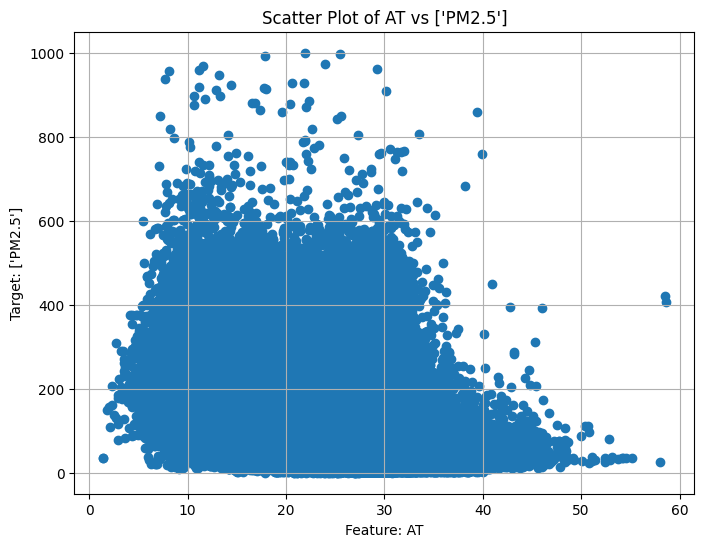

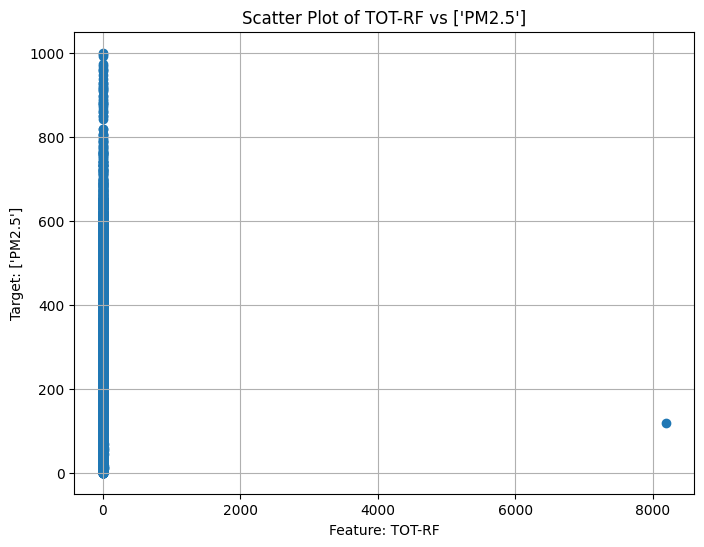

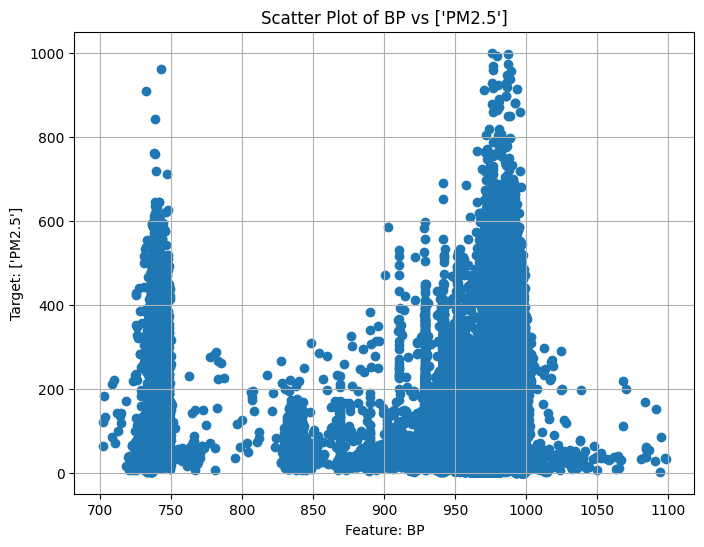

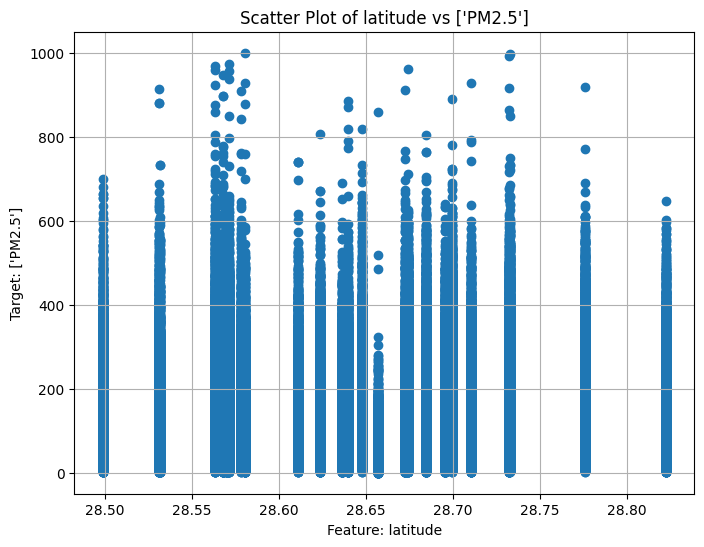

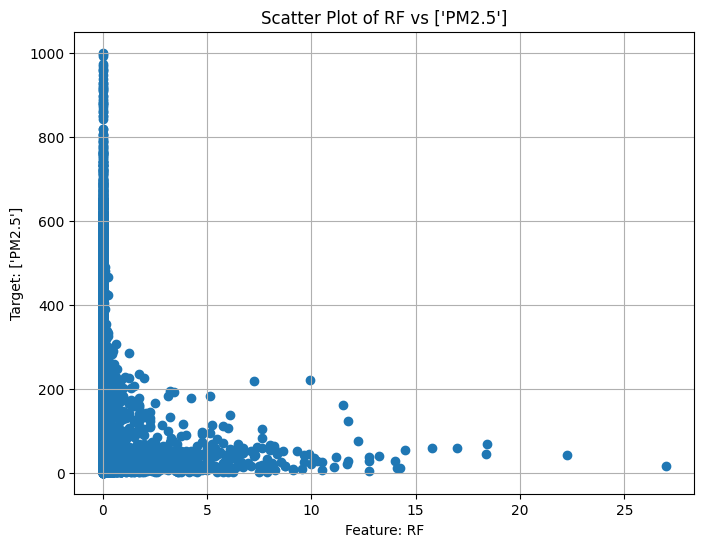

...

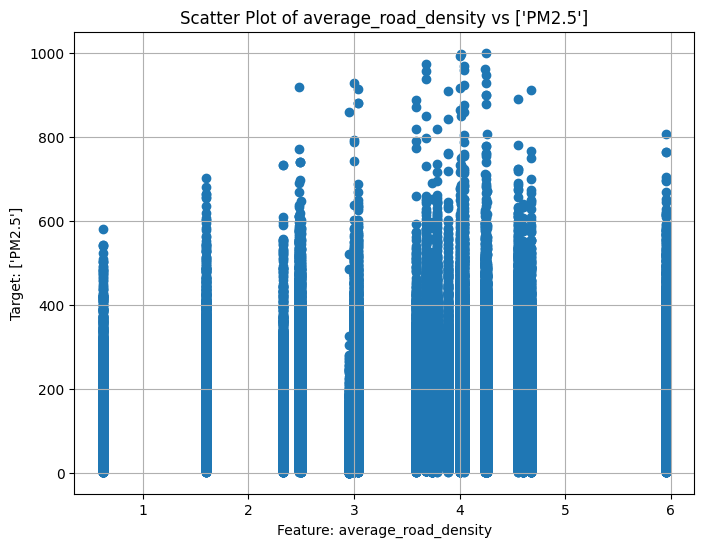

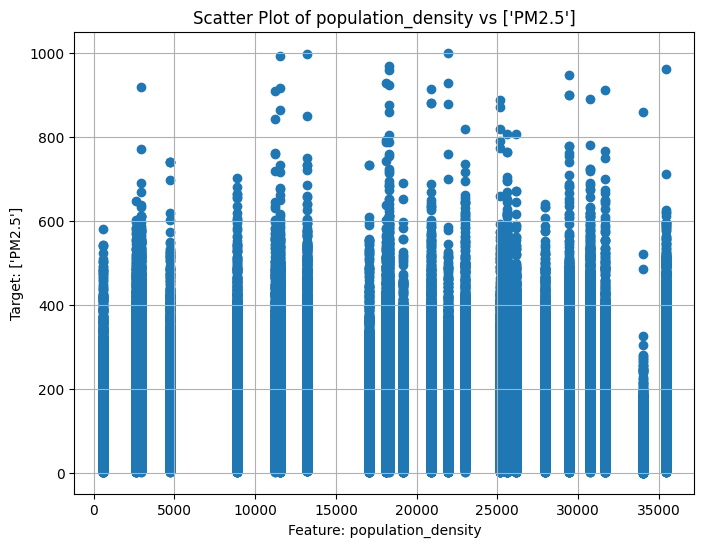

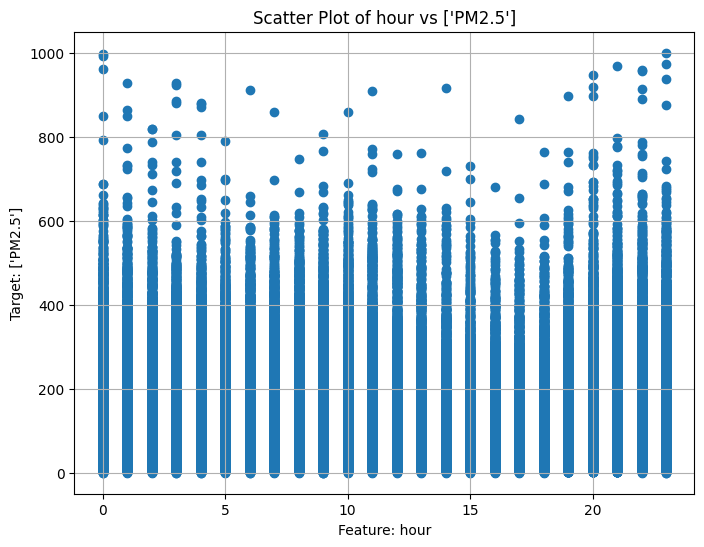

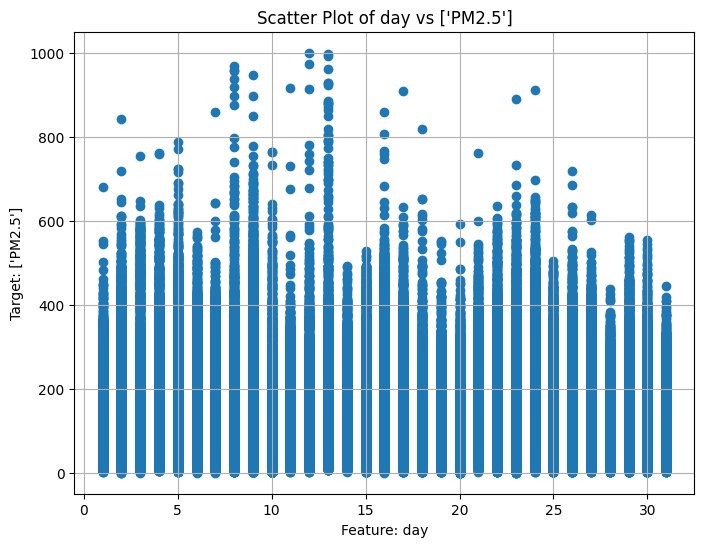

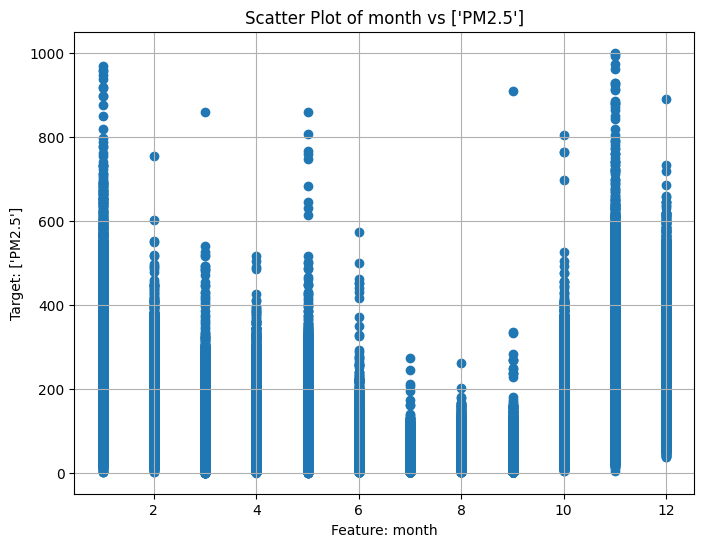

In [17]:
for feature in features_set:
    plt.figure(figsize=(8,6))
    plt.scatter(df[feature],df[target])
    plt.xlabel(f'Feature: {feature}')
    plt.ylabel(f'Target: {target}')
    plt.title(f'Scatter Plot of {feature} vs {target}')
    plt.grid(True)
    plt.show()

## Bar Plots Features vs PM2.5

In [7]:
cts_features = ['AT', 'TOT-RF', 'BP', 'RF', 'WD', 'RH', 'WS', 'SR']
dis_features = ['latitude', 'longitude', 'C1: Vehicle Services',
       'C2: Transportation Spots', 'C3: Factories',
       'C4: Decoration & Furniture Markets', 'C5: Food & Beverage',
       'C6: Shopping Malls & Supermarkets', 'C7: Sports', 'C8: Parks',
       'C9: Culture & Education', 'C10: Entertainment', 'C11: Companies',
       'C12: Hotels & Real Estate', 'motorway', 'trunk', 'primary',
       'secondary', 'tertiary', 'unclassified', 'residential', 'service',
       'motorway_link', 'trunk_link', 'primary_link', 'secondary_link',
       'tertiary_link', 'road_density_motorway', 'road_density_trunk',
       'road_density_primary', 'road_density_secondary',
       'road_density_tertiary', 'road_density_unclassified',
       'road_density_residential', 'road_density_service',
       'road_density_motorway_link', 'road_density_trunk_link',
       'road_density_primary_link', 'road_density_secondary_link',
       'road_density_tertiary_link', 'average_road_density',
       'population_density', 'hour', 'day', 'month']
target = ['PM2.5']

Discrete Features


Feature: latitude
--------------------------------------------------
28.498571       98.02
28.530785       101.87
28.531346       87.66
28.563262       120.23
28.56789        122.00
28.570173       84.47
28.571027       107.83
28.57834        174.70
28.58028        92.61
28.611281       99.90
28.623763       111.61
28.636429       93.35
28.639652       96.34
28.647622       120.25
28.656756       54.77
28.672342       104.22
28.674045       119.27
28.684678       122.13
28.695381       96.50
28.699793       124.24
28.710508       110.08
28.732528       114.56
28.73282        125.22
28.7762         121.77
28.822836       109.59


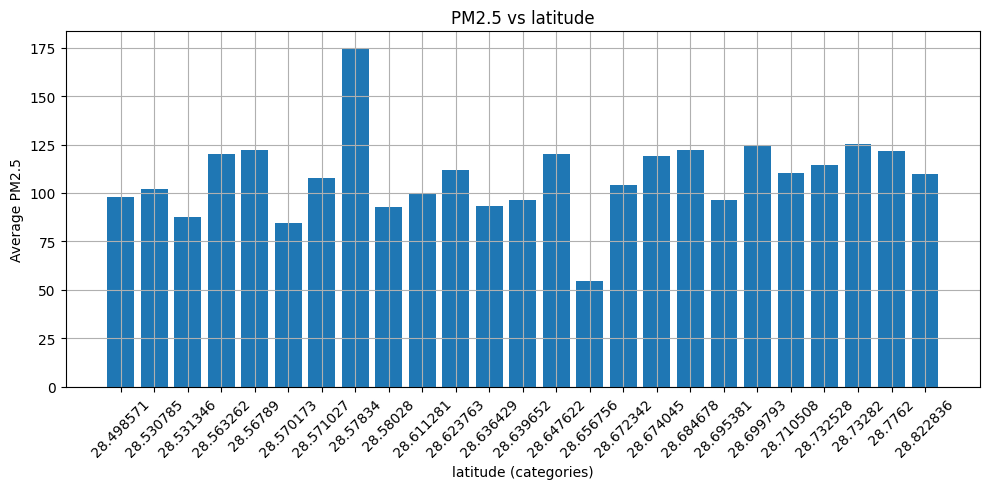


Feature: longitude
--------------------------------------------------
76.933762       84.47
77.051074       121.77
77.071901       107.83
77.076574       122.13
77.101981       109.59
77.11992        114.56
77.131023       119.27
77.146275       96.34
77.165453       124.24
77.170633       125.22
77.181665       96.50
77.184          174.70
77.186937       120.23
77.190156       87.66
77.201067       93.35
77.227234       54.77
77.233829       92.61
77.237738       99.90
77.249485       110.08
77.250515       122.00
77.26484        98.02
77.271255       101.87
77.287209       111.61
77.31526        104.22
77.315809       120.25


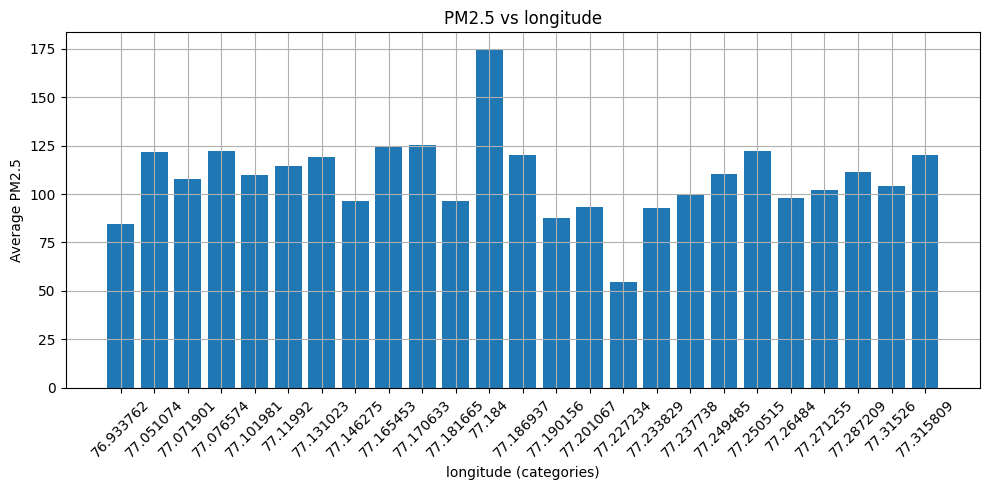


Feature: C1: Vehicle Services
--------------------------------------------------
0.0             107.63
1.0             109.91
4.0             109.29
5.0             111.61
6.0             106.22
7.0             124.24
8.0             102.37
9.0             119.27
10.0            54.77
11.0            114.56
12.0            104.22
13.0            92.61
15.0            101.87
17.0            107.58
18.0            120.23


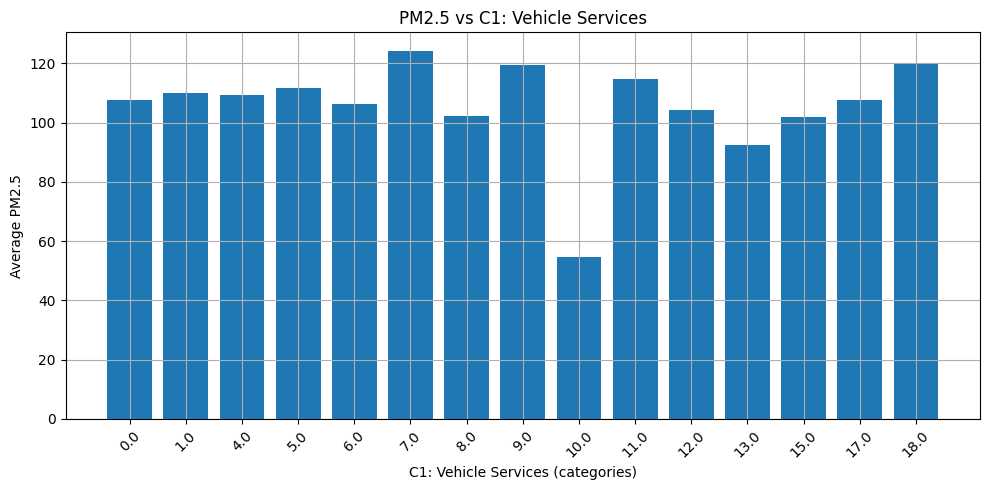


Feature: C2: Transportation Spots
--------------------------------------------------
0.0             110.43
12.0            110.08
22.0            98.02
24.0            107.83
25.0            122.13
41.0            114.56
50.0            125.22
56.0            100.46
72.0            124.24
80.0            96.34
81.0            119.27
100.0           101.87
144.0           111.61
149.0           122.00
155.0           87.66
160.0           120.23
175.0           93.35
183.0           92.61
189.0           54.77


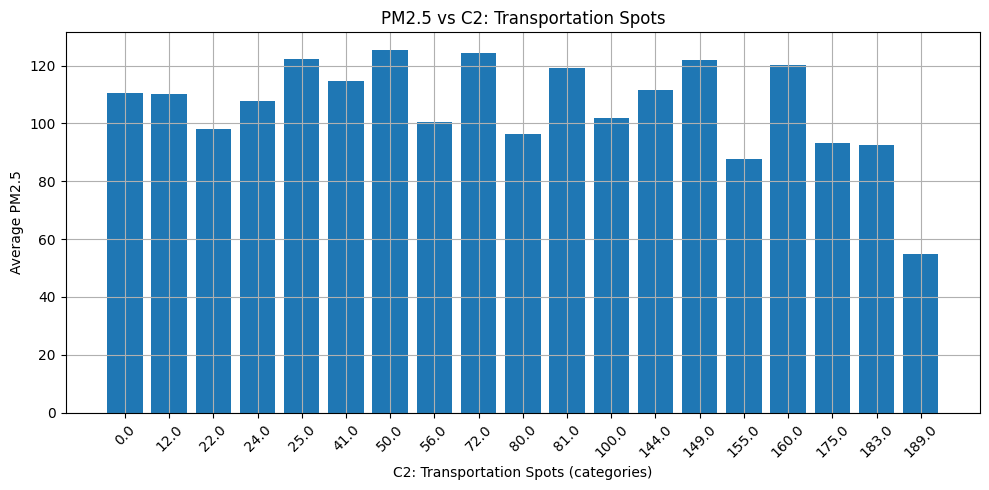


Feature: C3: Factories
--------------------------------------------------
0.0             107.90
1.0             103.37
2.0             125.22


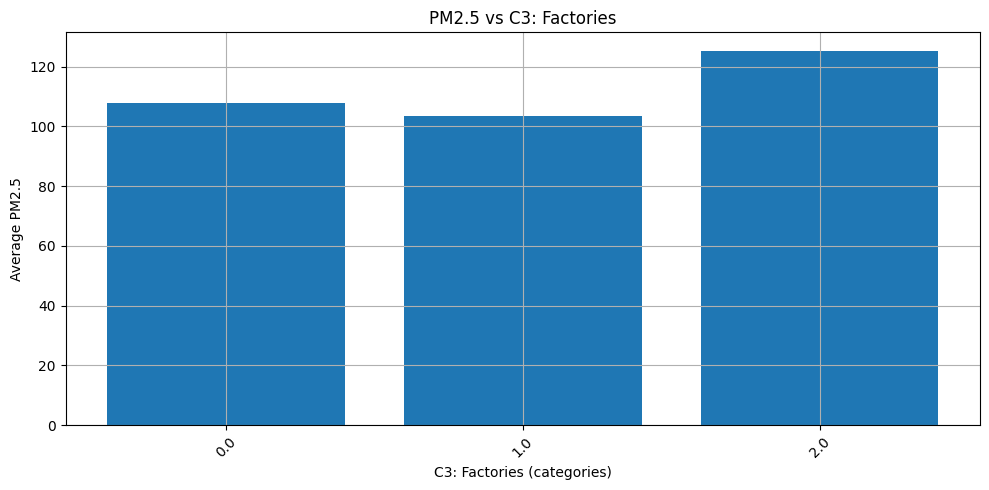


Feature: C4: Decoration & Furniture Markets
--------------------------------------------------
0.0             106.03
1.0             110.96
2.0             110.33
3.0             99.39
5.0             120.23


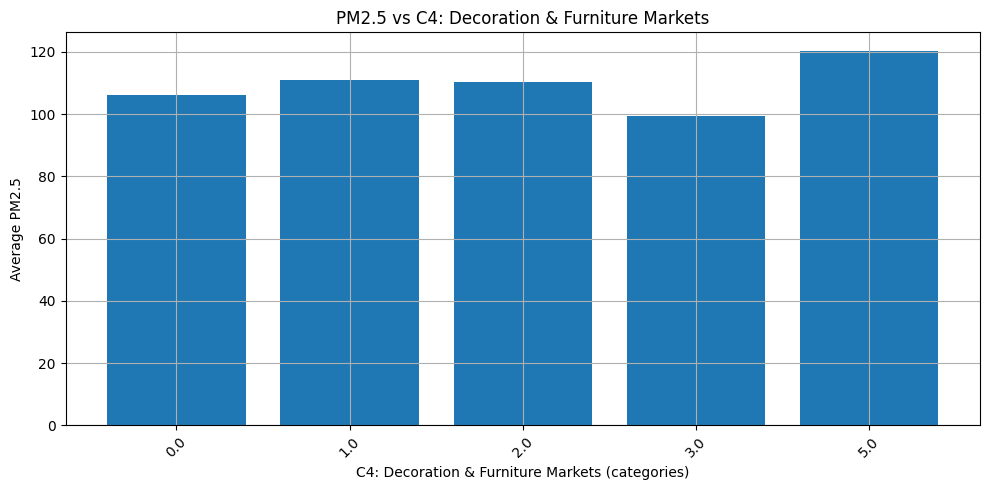


Feature: C5: Food & Beverage
--------------------------------------------------
0.0             110.43
1.0             116.10
4.0             98.02
10.0            96.34
16.0            119.27
22.0            96.50
24.0            124.24
30.0            125.22
34.0            104.22
39.0            101.87
42.0            107.83
53.0            114.56
98.0            92.61
105.0           120.23
114.0           87.66
125.0           54.77
126.0           111.61
163.0           122.00
269.0           93.35


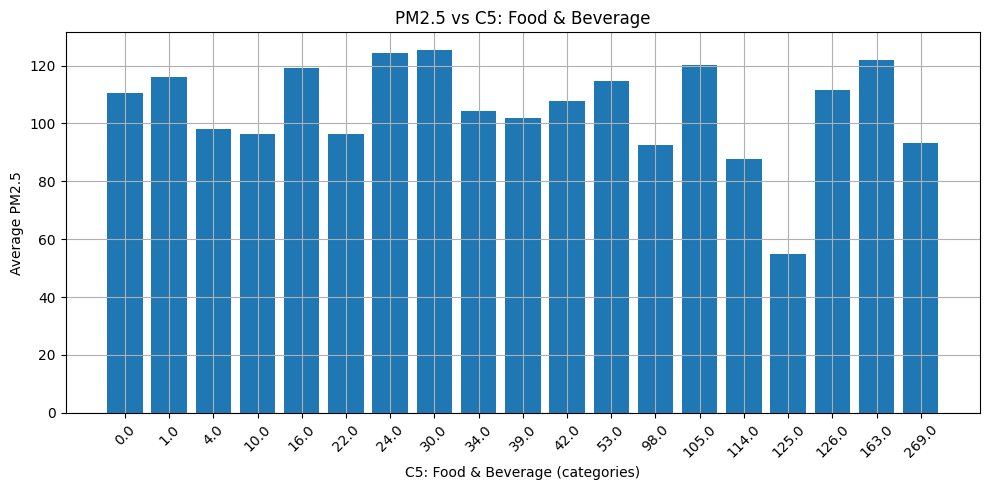


Feature: C6: Shopping Malls & Supermarkets
--------------------------------------------------
0.0             112.04
1.0             97.19
2.0             111.23
3.0             101.87
4.0             107.83
5.0             54.77
6.0             119.27
7.0             105.96
8.0             105.81
9.0             92.61
10.0            111.61
12.0            114.56
13.0            122.00


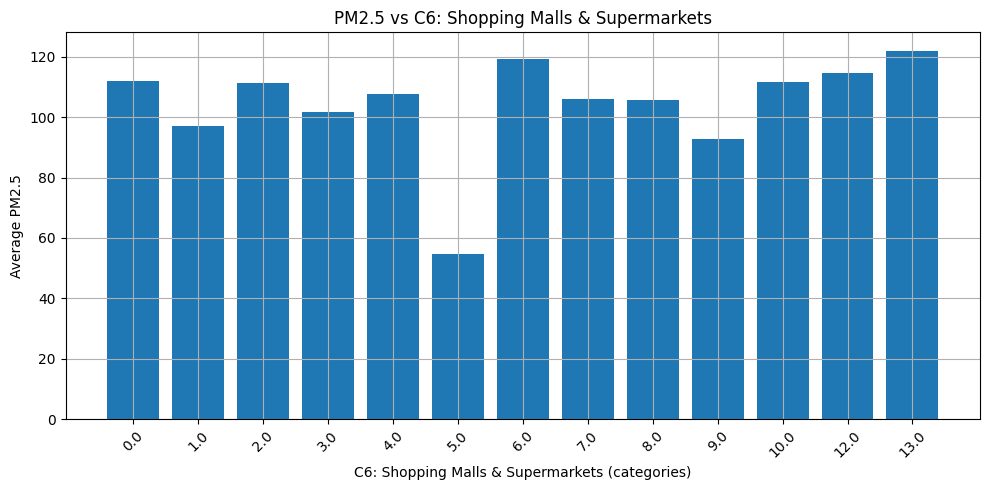


Feature: C7: Sports
--------------------------------------------------
0.0             112.04
1.0             96.34
2.0             99.95
3.0             119.27
4.0             108.84
5.0             94.61
6.0             120.23
7.0             119.81
8.0             107.83
11.0            87.66
14.0            92.61
16.0            111.61
19.0            122.00


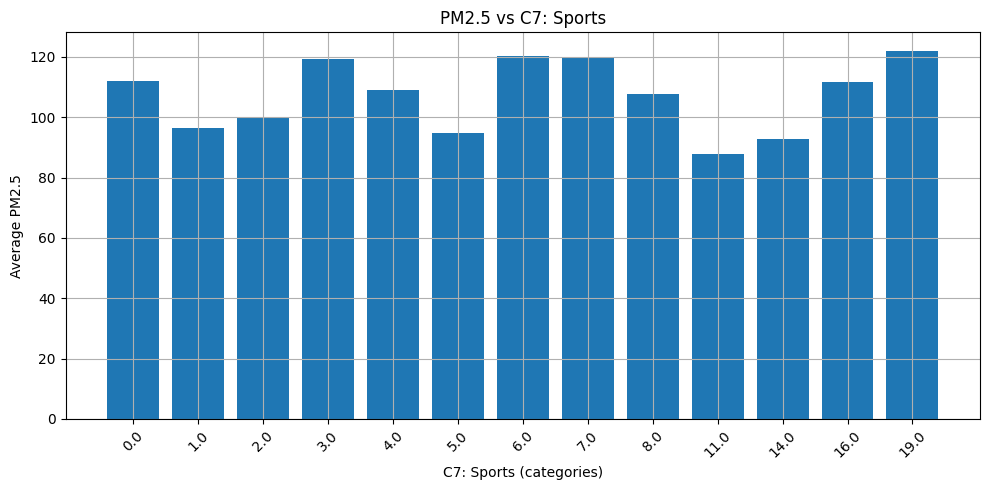


Feature: C8: Parks
--------------------------------------------------
0.0             107.63
9.0             98.02
14.0            121.77
27.0            110.08
30.0            54.77
31.0            96.34
51.0            93.35
71.0            114.56
77.0            122.13
80.0            107.83
89.0            101.87
109.0           87.66
116.0           120.23
124.0           119.27
172.0           125.22
179.0           96.50
190.0           111.61
191.0           124.24
213.0           104.22
240.0           122.00
253.0           92.61


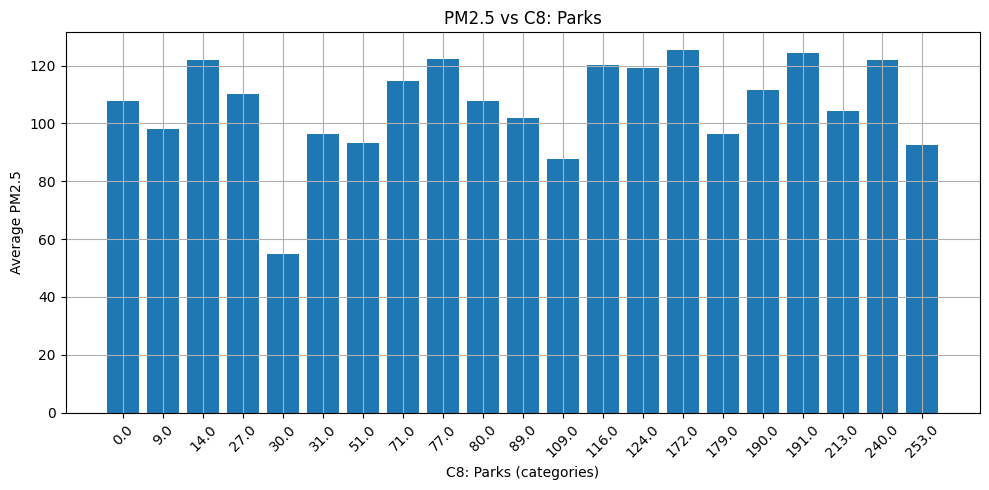


Feature: C9: Culture & Education
--------------------------------------------------
0.0             107.63
1.0             115.90
9.0             98.02
17.0            96.34
21.0            101.87
28.0            54.77
29.0            107.83
32.0            95.84
33.0            109.72
35.0            120.23
36.0            120.62
39.0            93.35
41.0            114.56
42.0            124.24
48.0            125.22
49.0            92.61
50.0            111.61


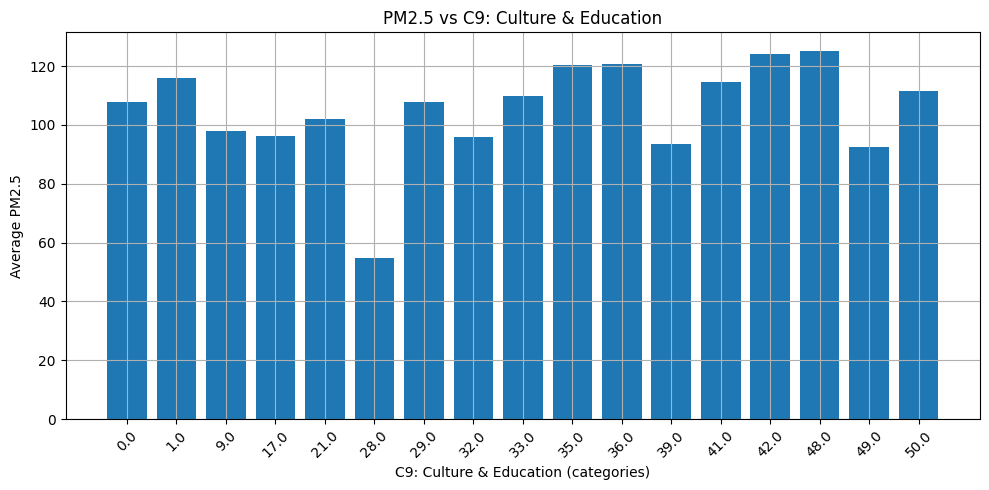


Feature: C10: Entertainment
--------------------------------------------------
0.0             108.50
1.0             110.38
2.0             111.90
3.0             98.79
4.0             107.43
8.0             122.00
9.0             92.61
10.0            93.35


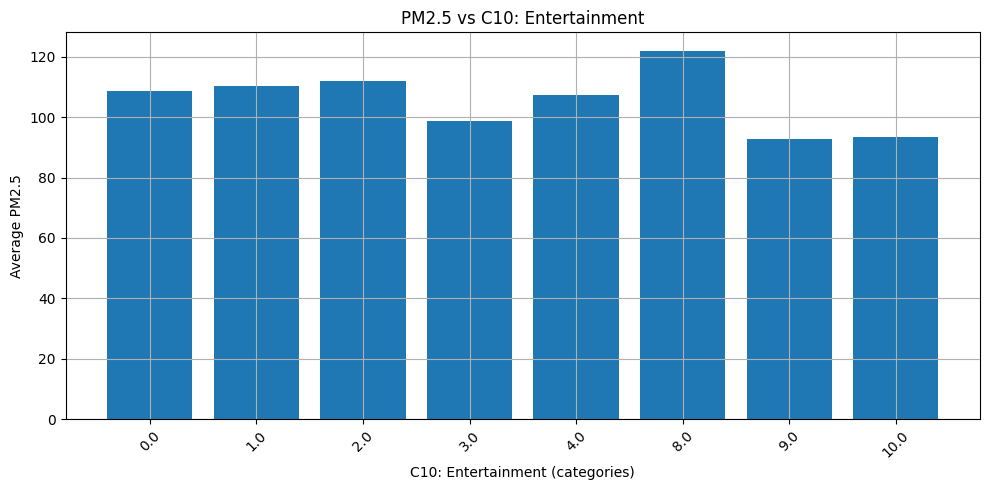


Feature: C11: Companies
--------------------------------------------------
0.0             110.37
2.0             98.02
3.0             119.27
11.0            96.50
15.0            114.28
16.0            96.34
20.0            54.77
24.0            122.13
25.0            117.36
26.0            87.66
30.0            107.83
36.0            122.00
50.0            111.61
52.0            101.87
53.0            108.89
114.0           93.35


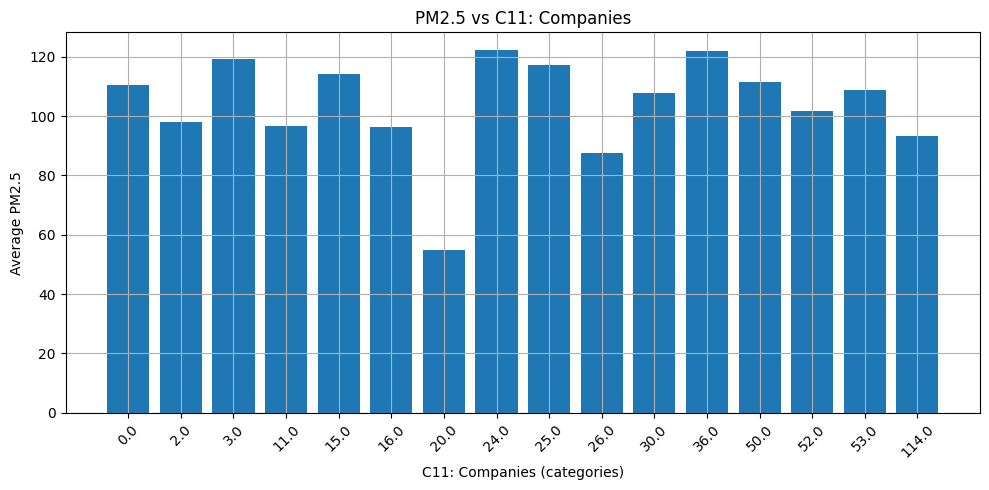


Feature: C12: Hotels & Real Estate
--------------------------------------------------
0.0             110.37
1.0             120.02
2.0             97.29
3.0             110.76
6.0             107.89
8.0             104.85
11.0            92.61
12.0            87.66
22.0            121.11
92.0            54.77
130.0           93.35


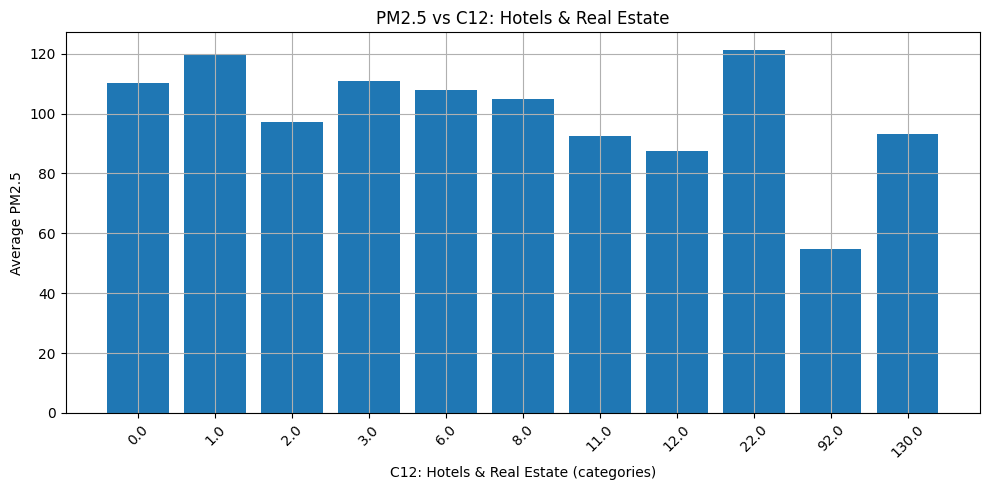


Feature: motorway
--------------------------------------------------
0.0             107.43
802.5658919366226 122.00


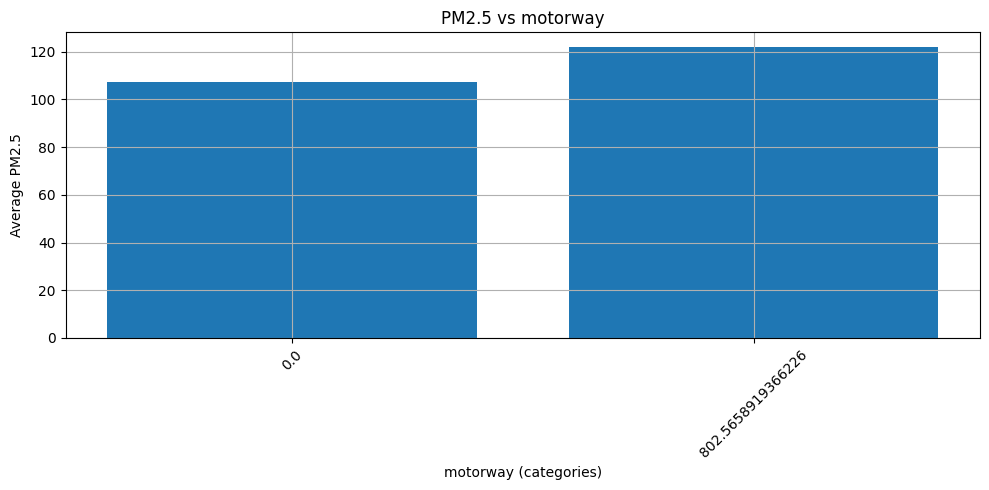


Feature: trunk
--------------------------------------------------
0.0             108.81
4134.277156038788 101.87
4630.542656997683 92.61
5393.078728379447 54.77
5448.99765917629 122.00
5505.519291075369 104.22
5929.185908012726 111.61
6616.356005409183 110.08
7326.964239423992 87.66
8933.085520569352 122.13
10344.932254813284 125.22


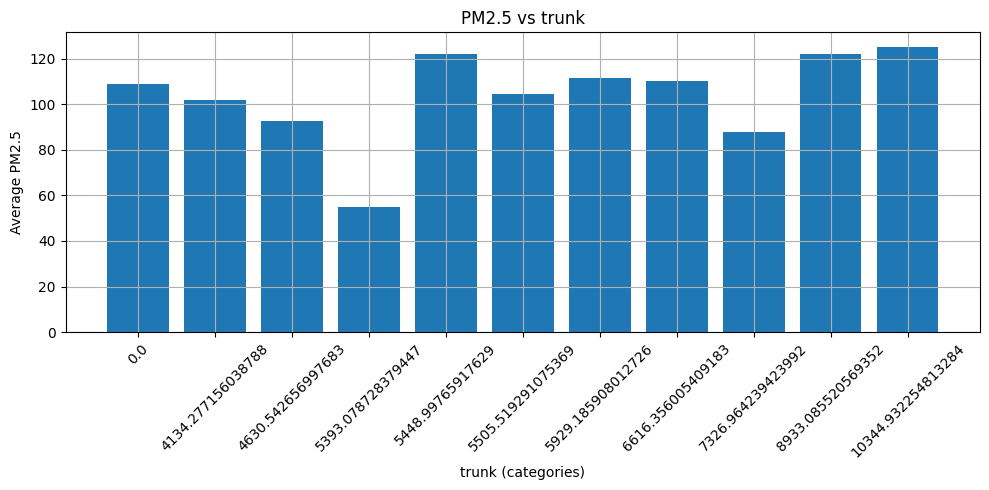


Feature: primary
--------------------------------------------------
0.0             111.05
599.9734250753111 93.35
1273.5564516915586 54.77
2353.6264974277533 104.22
3486.050619990456 96.34
3814.360132238106 125.22
5564.492514336418 84.47
6093.554715196364 122.13
6746.658223163177 110.08
6830.941827246132 87.66
7029.494575245492 96.50
7250.579004149803 98.02
8223.291571920125 114.56
10741.615840925992 124.24
11263.766438417344 92.61
12708.564664849537 121.77
13042.860460692831 122.00
13580.498907345374 111.61
15653.26808329544 120.23
18602.20619711637 119.27


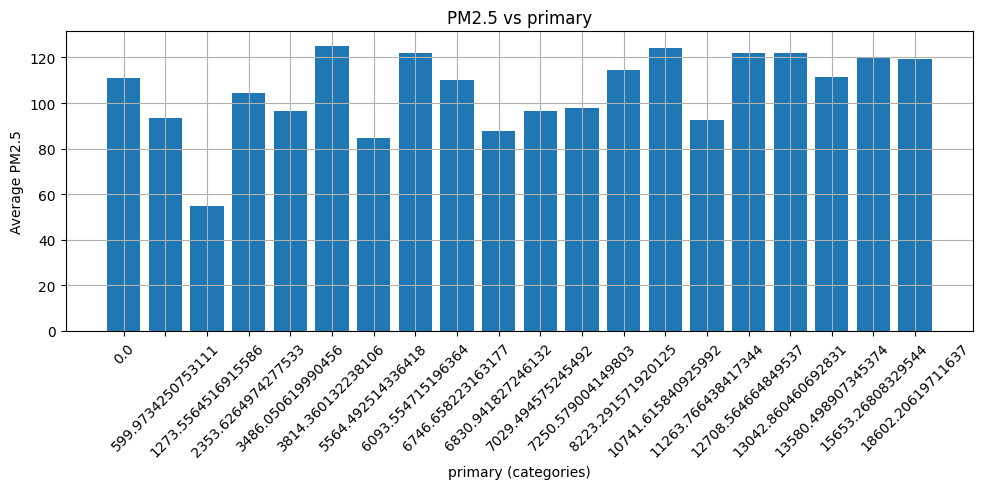


Feature: secondary
--------------------------------------------------
0.0             112.37
2036.4432516524696 98.02
6397.762019642283 110.08
8817.494331064157 114.56
11798.05272020155 119.27
13946.657470359798 120.23
13952.05632490644 125.22
14493.232650566631 87.66
16252.58844684394 111.61
17054.29097036282 96.50
18356.01213451225 122.00
24020.03813889297 101.87
24153.933080964434 96.34
24688.612675290828 124.24
25640.48838525528 107.83
25707.545471400084 92.61
32384.023420690824 104.22
39242.49342408152 93.35
39855.403733567575 54.77


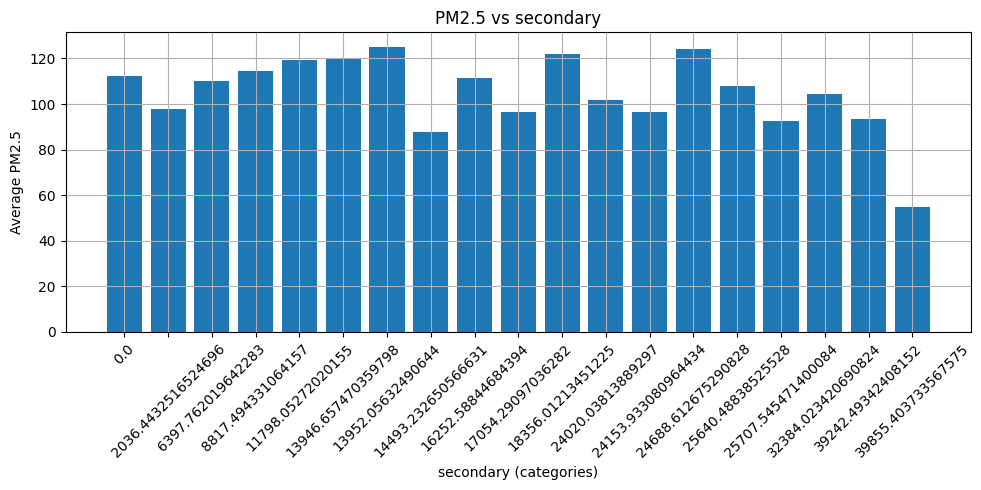


Feature: tertiary
--------------------------------------------------
0.0             115.18
6892.622645305848 96.34
8293.343147794687 87.66
9865.546649514028 98.02
12330.30621613491 84.47
12819.361747029285 110.08
20384.149271735463 111.61
21109.05833282913 121.77
23740.224466857784 96.50
24575.47470736497 119.27
27176.67402130121 104.22
28773.34285394992 124.24
29230.0256015606 107.83
30673.708995396468 122.00
31272.60968314465 120.23
31287.75910880571 92.61
31615.92105827355 114.56
33324.21290775947 54.77
34466.48161815451 122.13
36823.6753784681 125.22
40834.86284249584 101.87
48408.68770374781 93.35


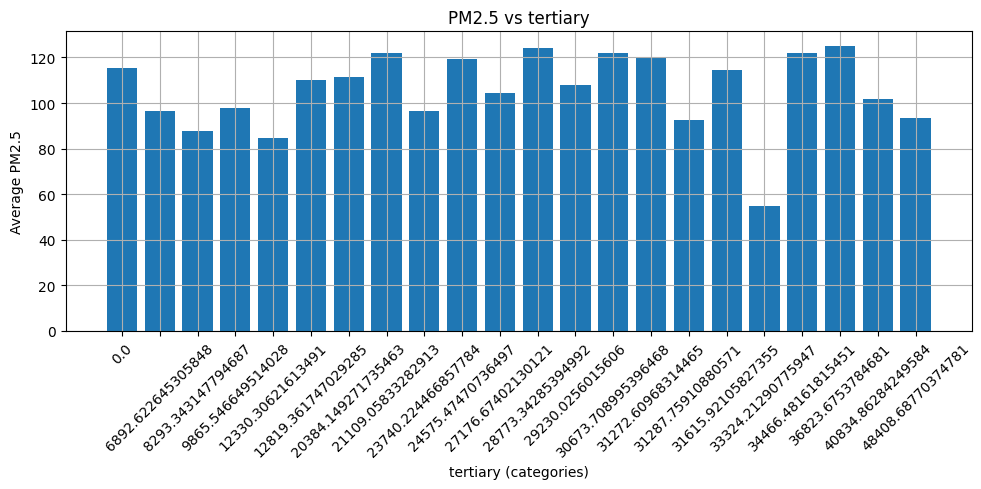


Feature: unclassified
--------------------------------------------------
0.0             114.97
8.800816818382227 122.13
21.11307505497521 93.35
71.0812618547419 114.56
471.7973246613702 104.22
501.76509058254953 122.00
780.4632877099759 120.23
953.022394387624 87.66
1432.969047385824 84.47
1880.3386811632272 124.24
1893.308469344755 96.50
2496.314644708326 125.22
3072.452984603948 98.02
3146.311229736976 92.61
3312.212121024102 111.61
4896.373470660016 54.77
6175.524432394695 101.87
7784.675584545941 107.83
9375.2644095965 96.34
14225.3470469827 121.77


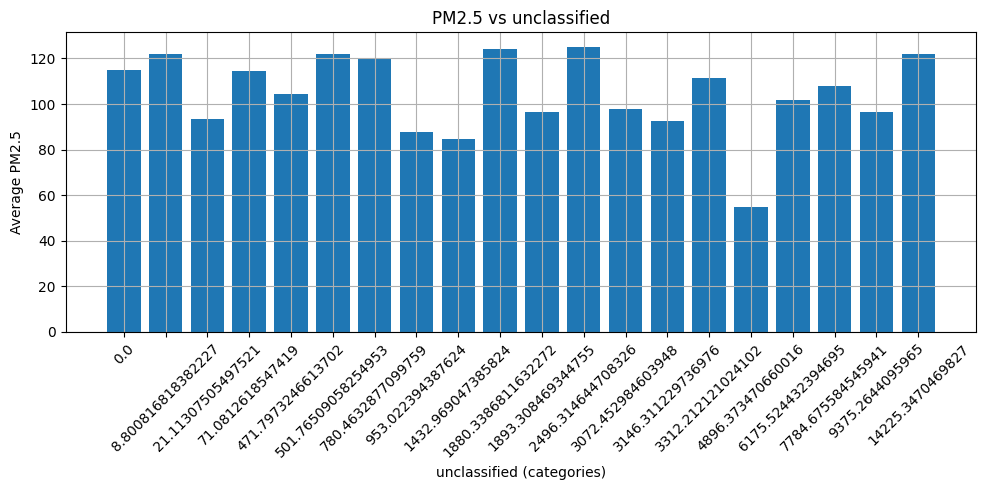


Feature: residential
--------------------------------------------------
0.0             115.18
26845.242073345245 84.47
77637.5680710495 87.66
83164.95199152212 98.02
113154.21810553657 54.77
128060.6130989494 121.77
129527.2529516378 101.87
133069.18493448838 114.56
143541.29680869283 107.83
149759.13078149545 93.35
156968.73377203598 96.34
159264.17445215094 110.08
169985.58659844514 125.22
189645.59540080625 120.23
202700.4877344289 92.61
206702.63502265405 119.27
215059.5615246058 122.00
218722.8041763897 111.61
219519.66459561948 104.22
221856.37423977605 124.24
227343.8977910677 96.50
334305.27608551393 122.13


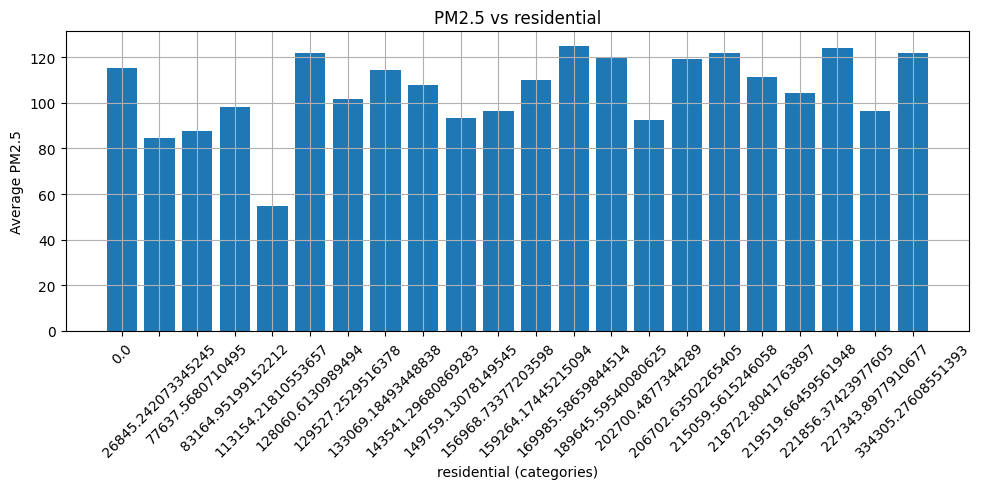


Feature: service
--------------------------------------------------
0.0             115.18
3851.716393110783 84.47
10921.022448623686 98.02
13266.705397579331 110.08
25391.54741796285 121.77
33489.5481426492 122.13
33990.61035499976 54.77
35180.36006697425 111.61
40322.72477156101 101.87
43245.50628856751 122.00
46282.76739477373 119.27
46805.69812590372 120.23
47173.23806573847 125.22
51458.03214050809 124.24
51717.30817846569 92.61
53993.62537536303 93.35
54164.52150160458 96.50
56281.40262051291 87.66
59129.68543013319 104.22
63087.172600117854 96.34
69934.11369689227 107.83
116345.40400468232 114.56


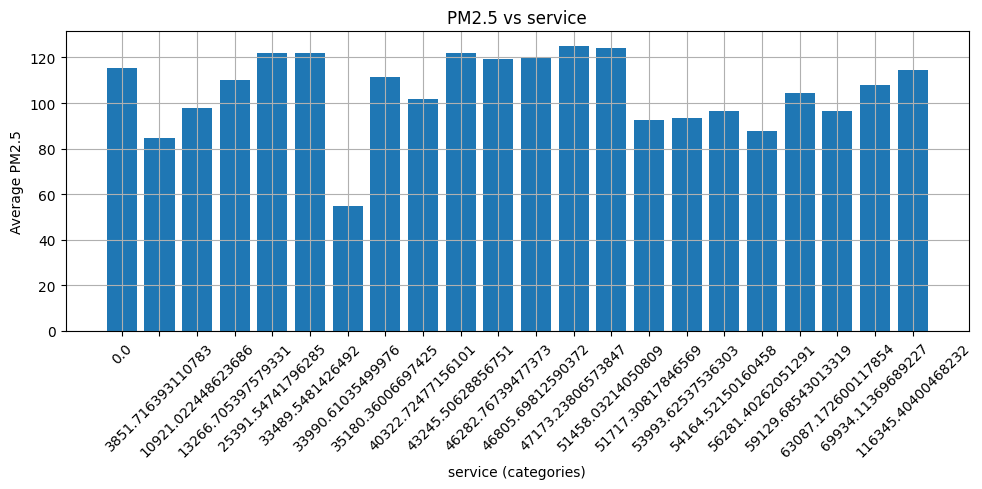


Feature: motorway_link
--------------------------------------------------
0.0             107.24
322.61270887827715 111.61
1426.3842862610916 122.00


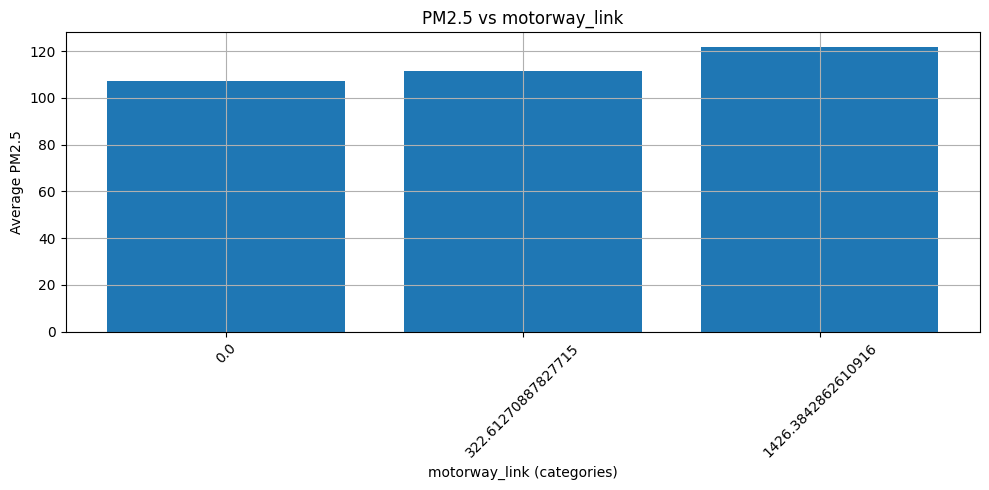


Feature: trunk_link
--------------------------------------------------
0.0             108.90
58.41239103354226 104.22
294.41876666138216 87.66
309.5426354836536 122.13
1550.4403140682264 122.00
1593.3759858114126 111.61
2945.9529785367126 92.61
3193.0995047174724 54.77
4198.669125561087 101.87
6610.365031050347 125.22


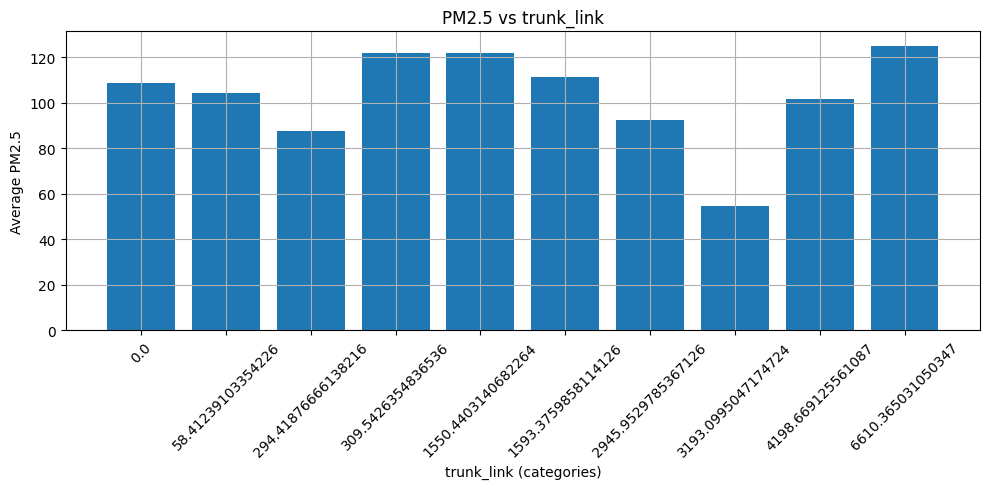


Feature: primary_link
--------------------------------------------------
0.0             108.02
8.629466096909013 84.47
15.908324665124406 87.66
38.14172668405936 114.56
44.025894730464685 93.35
73.84119805176222 121.77
98.84006535975726 125.22
206.13768091466704 120.23
209.15265760857767 98.02
368.7130116000935 54.77
701.2260489305208 122.13
1004.9339147122172 110.08
1291.8463304978388 96.50
2387.2126164210376 119.27
3117.035240831537 124.24
3997.900116473224 92.61
4138.333062899462 111.61
4868.722687515397 122.00


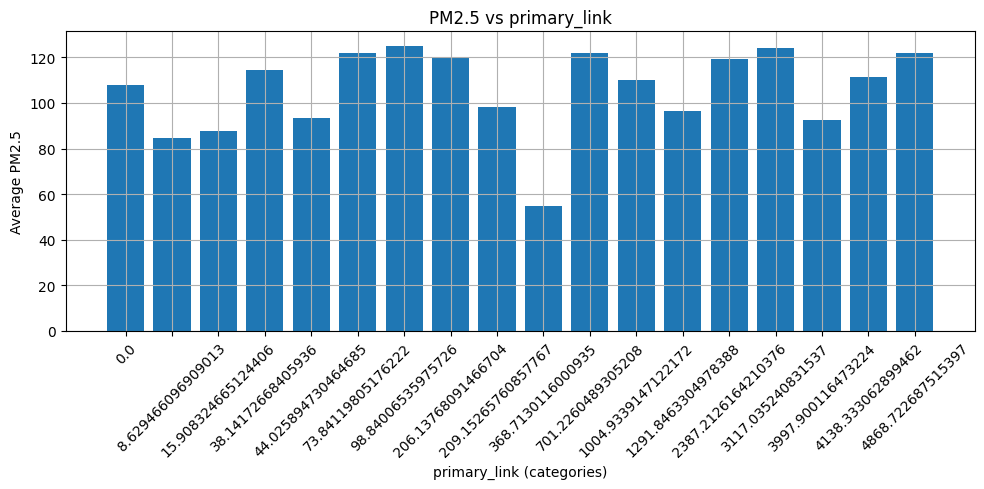


Feature: secondary_link
--------------------------------------------------
0.0             110.32
45.17911141021872 114.56
180.8387766808704 125.22
213.5328471017221 111.61
233.075092109904 110.08
396.7065538521768 104.22
498.6987711683376 119.27
564.861725732364 87.66
679.5329904333397 96.34
1176.4430884858143 120.23
1264.0360808461487 96.50
1283.710052303391 93.35
1339.5568832583554 124.24
1489.752673954595 122.00
1589.9714631477568 101.87
1815.61118577129 107.83
3359.4167663153366 54.77
4430.161869652095 92.61


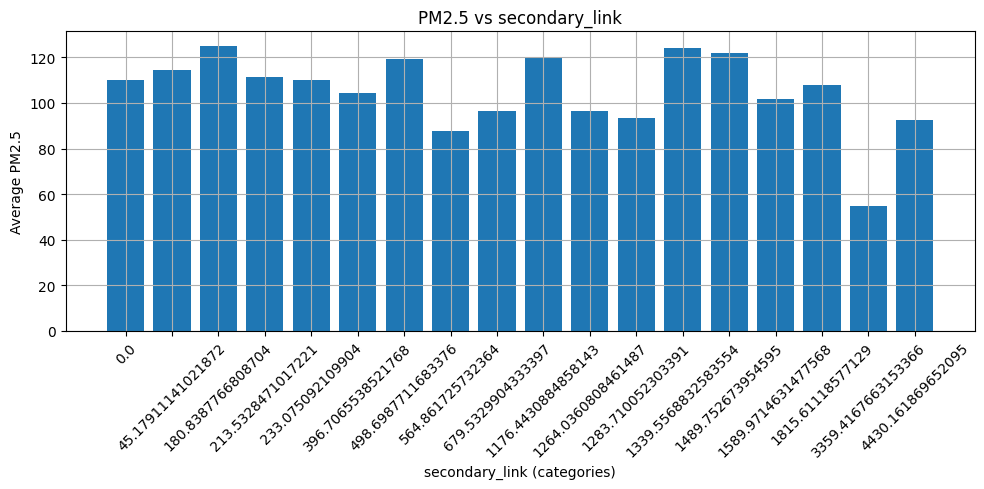


Feature: tertiary_link
--------------------------------------------------
0.0             105.46
32.93213207914742 110.08
38.95051634777344 121.77
66.73506879449792 54.77
72.91865806236939 119.27
108.38218745379432 114.56
152.45760121025148 122.13
178.47726303080012 96.34
183.2834897104649 87.66
244.2047861485762 96.50
253.86858116406165 125.22
255.757667306202 124.24
284.8818878066511 93.35
322.32102865014355 92.61
362.6585326114557 122.00
389.13456823136414 111.61
806.1945457999971 120.23
859.3509252455428 104.22


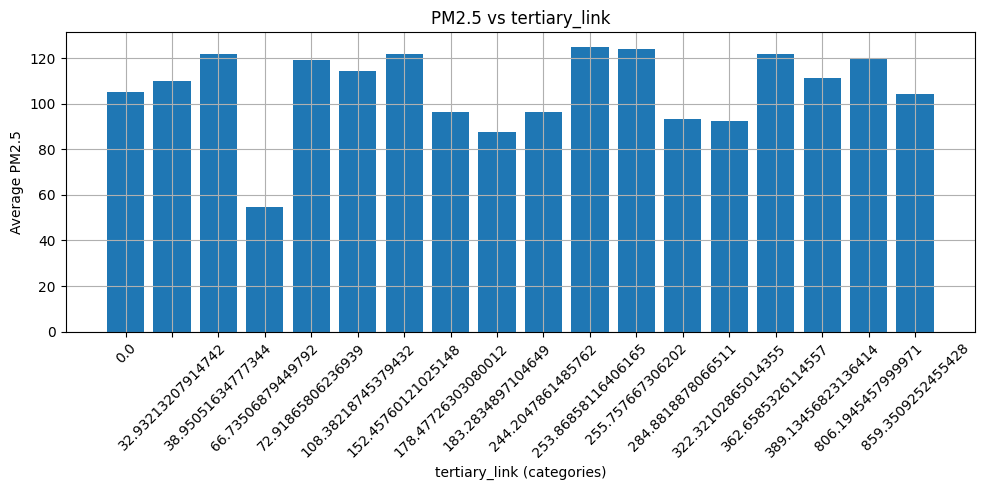


Feature: road_density_motorway
--------------------------------------------------
0.0             107.69
0.0062249723982452 109.59
0.0120062823362216 99.90
0.0434834431508316 107.83
0.2565031695494962 122.00


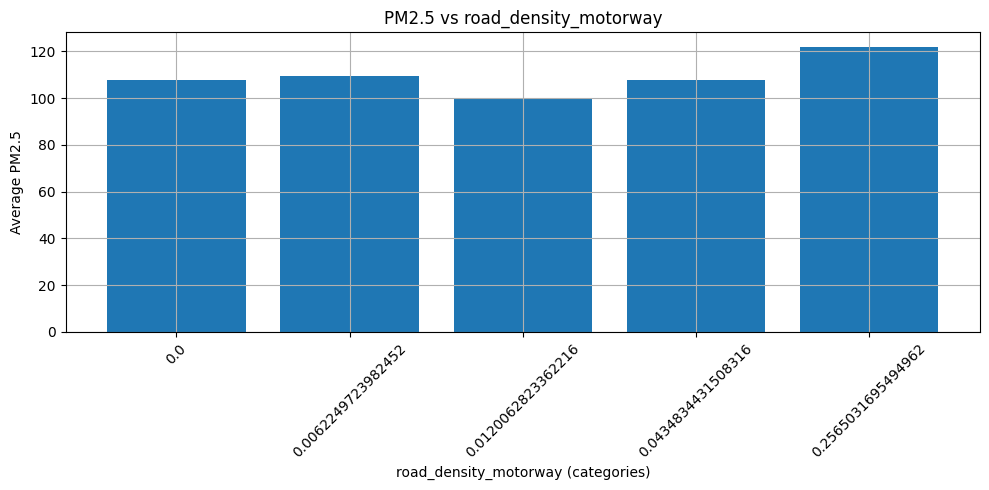


Feature: road_density_trunk
--------------------------------------------------
0.0             106.08
0.0395606283996409 174.70
0.1120394095711795 120.25
0.2299736992704189 120.23
0.3312552635252833 101.87
0.3682570350798932 92.61
0.4371891692279168 104.22
0.4715792259805617 111.61
0.4717353975688391 54.77
0.6162455067022817 99.90
0.6351192560224831 110.08
0.6465800578023276 122.00
0.6934255788312136 87.66
0.7263217983124912 122.13
0.8229975922751346 125.22


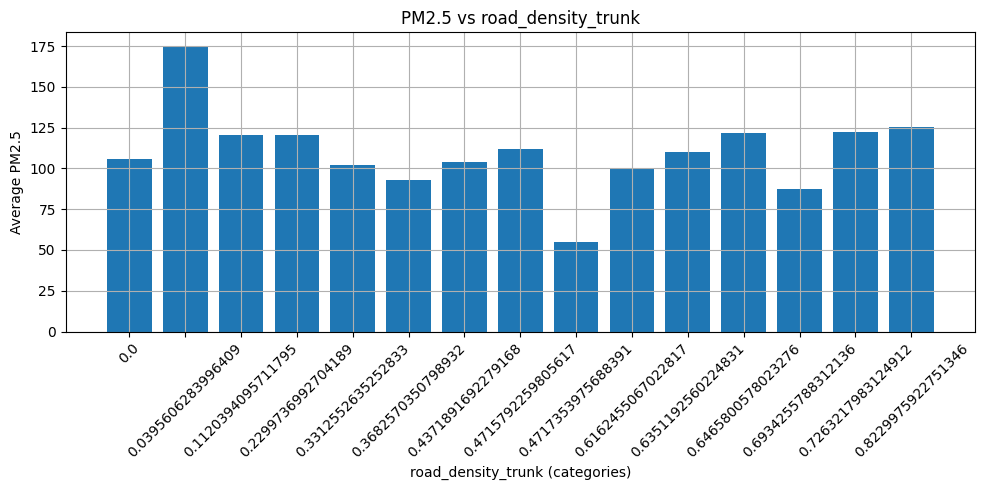


Feature: road_density_primary
--------------------------------------------------
0.0240593724162896 107.83
0.0516249672094434 93.35
0.0647575184020171 99.90
0.0697793087625286 109.59
0.0956323772951175 101.87
0.143364129170726 54.77
0.1869029513708655 104.22
0.3133898652568506 96.34
0.3250336866862927 125.22
0.4368249641583074 120.25
0.4481852137147772 84.47
0.5384755665033145 110.08
0.5535324103884779 96.50
0.622948580190671 87.66
0.6588765202326052 98.02
0.7170231544465977 122.13
0.8897999179913811 114.56
0.926578352533719 124.24
0.931475001920954 92.61
0.9824655431337505 174.70
1.2448609240248054 121.77
1.2949703125162022 111.61
1.3138958631393245 120.23
1.5245157670739984 119.27
1.5934682086135417 122.00


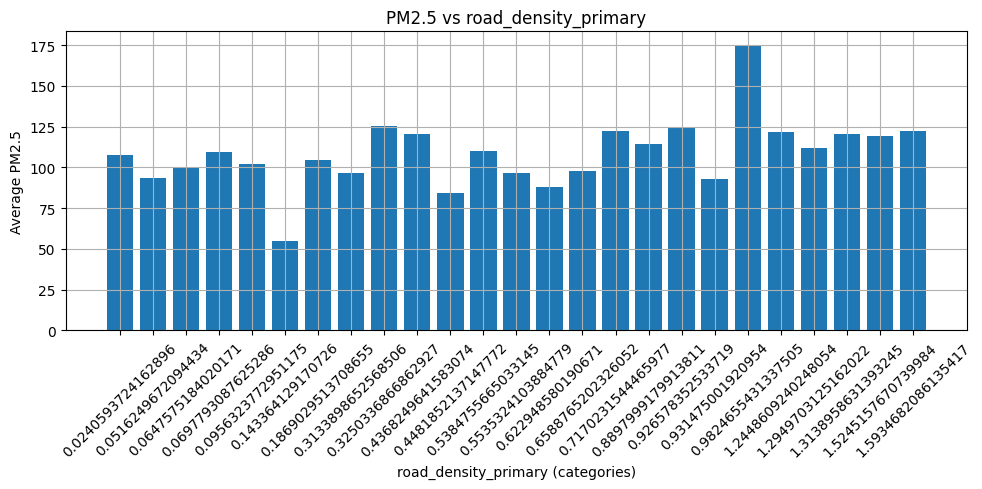


Feature: road_density_secondary
--------------------------------------------------
0.0             84.47
0.0010519861496132 121.77
0.1049305765948914 109.59
0.1093960036730349 122.13
0.2838779738150419 98.02
0.5503653988277772 110.08
0.8541195647101814 114.56
1.2606742327595506 120.23
1.3342069177646982 111.61
1.349706779405547 125.22
1.35757404108422 119.27
1.423044449324018 87.66
1.5548904065830012 122.00
1.7154510095250313 96.50
1.875297774812299 174.70
2.030921019829569 101.87
2.100718843815235 96.34
2.1614811836969525 124.24
2.398889870528025 92.61
2.551468306756777 107.83
2.667926207936996 120.25
3.114572887838428 104.22
3.70521974479038 93.35
3.806631211853256 54.77
5.775962121018395 99.90


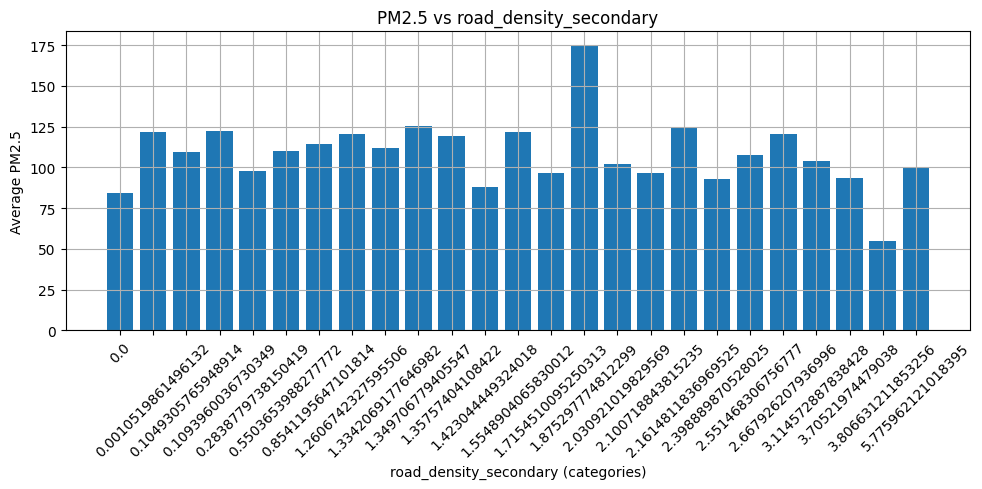


Feature: road_density_tertiary
--------------------------------------------------
0.787680795081824 96.34
0.8305149730464858 99.90
1.4902817251537688 87.66
1.7040394370079803 98.02
2.042509169540877 84.47
2.188434650169729 120.25
2.2810372087492223 110.08
2.71837478546358 119.27
2.743361264677532 121.77
2.810630583708142 96.50
2.84128083745112 111.61
3.2166778782962457 124.24
3.3682522529879946 120.23
3.663353102066296 92.61
3.671768902648341 122.13
3.699724673241802 104.22
3.7193373158184575 114.56
3.844057328963546 174.70
3.982975261166368 122.00
4.539183494885607 107.83
4.639099335003807 54.77
4.666407023147716 101.87
4.871508184928234 109.59
5.072887390668733 125.22
6.4963266631739565 93.35


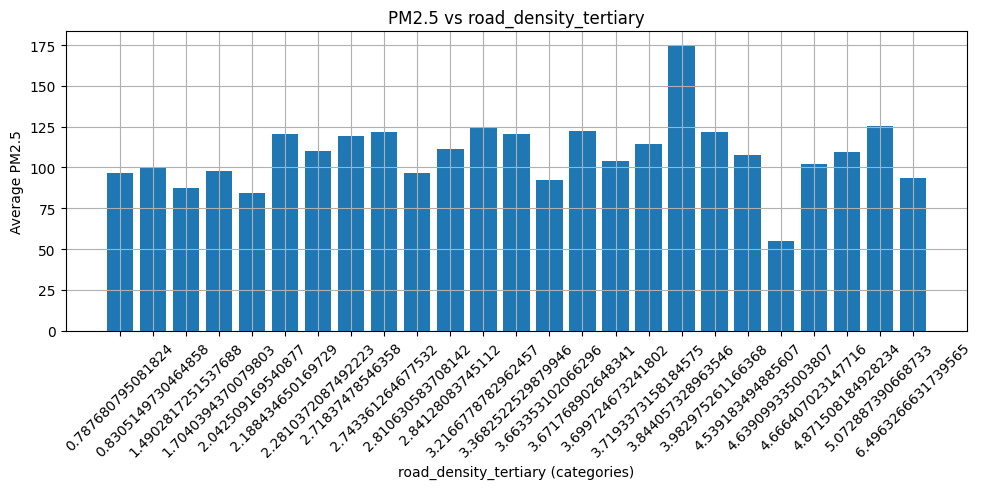


Feature: road_density_unclassified
--------------------------------------------------
0.0             114.66
0.011313314548388 114.56
0.0131636512919105 93.35
0.0185599984892798 122.13
0.0749852007790772 174.70
0.0832381608327621 120.23
0.0962186267919694 120.25
0.1070578837083884 104.22
0.1201528798717327 122.00
0.1484502633703696 87.66
0.228061981152317 84.47
0.2526443204692516 124.24
0.3008476497737503 96.50
0.3590860536897227 99.90
0.4674327660385227 92.61
0.5715997535473595 111.61
0.6278627265809446 125.22
0.6366790749640998 98.02
0.6988238683516443 54.77
0.9763560779311348 101.87
1.3294234743807791 107.83
1.4525527117528438 96.34
1.6773027243741678 121.77
2.01506769549776 109.59


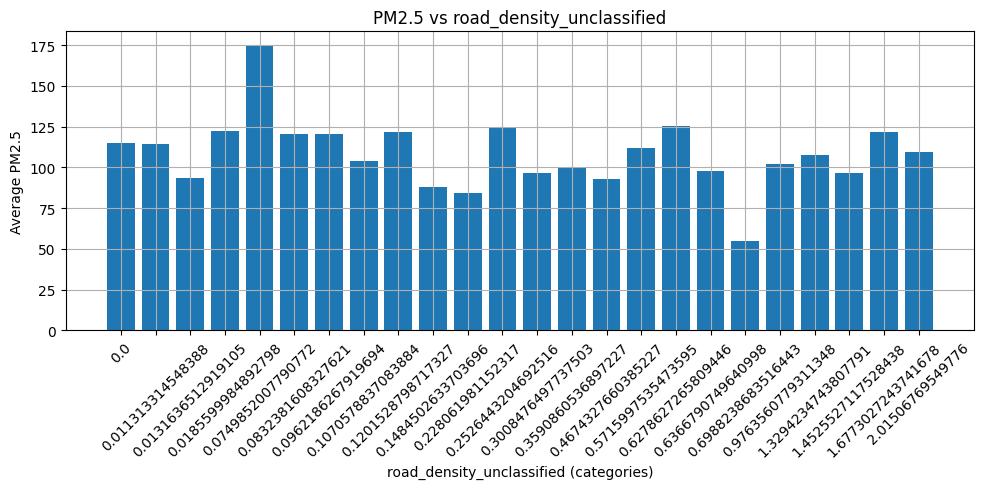


Feature: road_density_residential
--------------------------------------------------
4.689494785847761 84.47
10.905484419247422 99.90
14.143978434051135 98.02
14.942930860771432 109.59
16.357451324009084 87.66
21.01603800992586 54.77
22.085122959567126 121.77
23.6185348659469 101.87
27.07036485600495 114.56
27.30837095921425 107.83
27.94031905820281 93.35
31.31939524198622 96.34
32.618682844711486 174.70
32.66654716440668 110.08
33.633424213562165 120.25
34.7097168580062 125.22
36.29151989959728 92.61
36.43953364626877 122.00
36.556936240843896 120.23
40.37283894697424 119.27
41.66794426081938 111.61
42.38190187702676 104.22
42.79769970579919 124.24
44.69139150787564 96.50
66.32224317909981 122.13


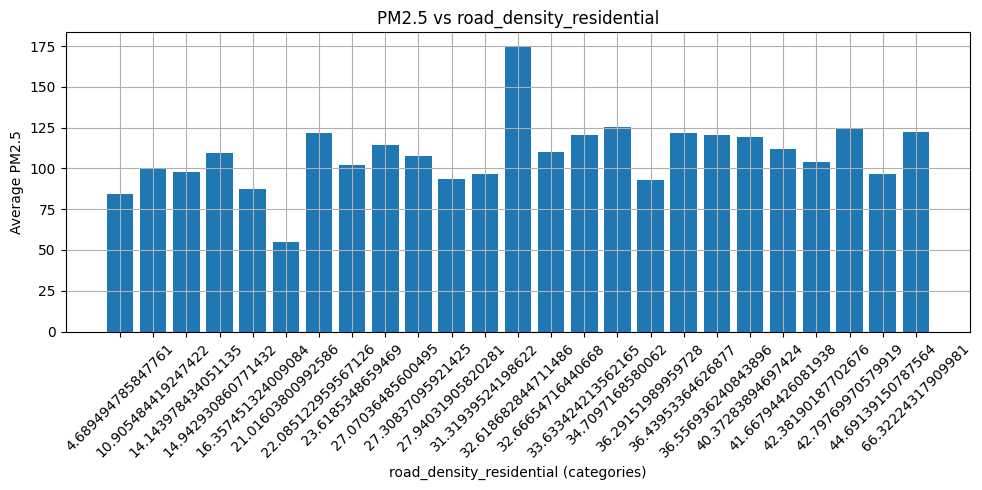


Feature: road_density_service
--------------------------------------------------
0.6420671502330169 84.47
2.1255162214725165 110.08
3.29282971343918 98.02
4.4153019866381 121.77
5.774404855458755 122.13
6.581708717022782 111.61
6.812964765547959 54.77
7.277261899526541 101.87
8.634488549539807 125.22
8.836015481611673 119.27
9.345392375725789 87.66
9.362552031221416 124.24
9.436801166663033 122.00
9.511150457711969 120.23
9.530628775346631 96.50
9.757194816394374 120.25
10.025496764339367 92.61
10.264969513864454 93.35
10.39869681969376 109.59
10.612014928938432 96.34
10.723775822417233 104.22
10.764406447468696 174.70
11.906865734071037 107.83
12.470036889667426 99.90
19.45855720723281 114.56


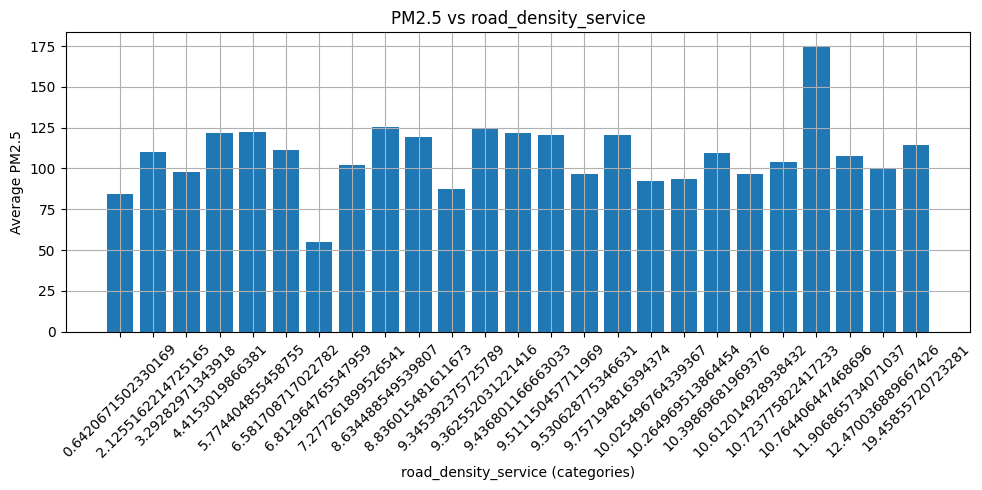


Feature: road_density_motorway_link
--------------------------------------------------
0.0             107.60
0.0256999230279053 111.61
0.0318412397520134 99.90
0.1949127953959219 122.00


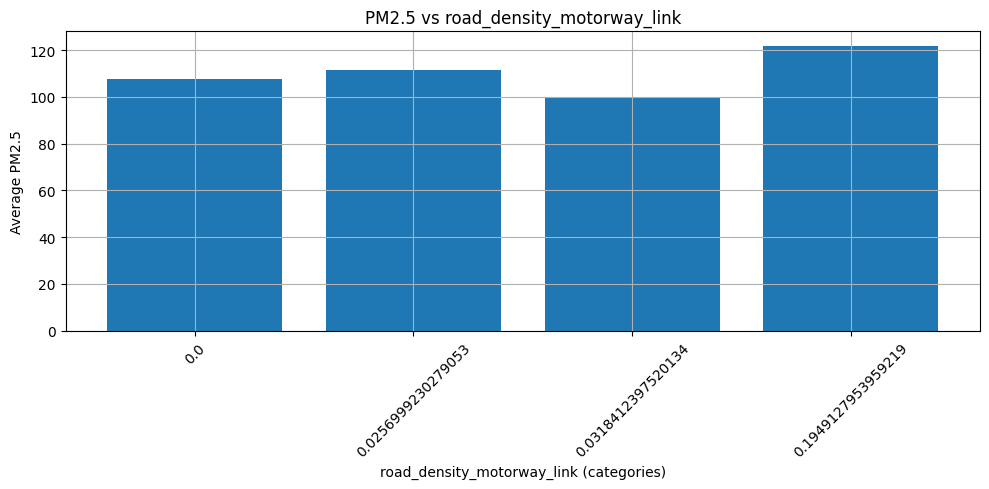


Feature: road_density_trunk_link
--------------------------------------------------
0.0             108.00
0.0046482235768132 104.22
0.0260242945347795 122.13
0.0427922076839862 87.66
0.1021312330215945 110.08
0.1135259593004253 174.70
0.1297318839822236 111.61
0.2362475245175412 92.61
0.2898946375241115 99.90
0.3460356916022026 54.77
0.3506960320751771 101.87
0.4325992430840296 122.00
0.5260829952936742 125.22


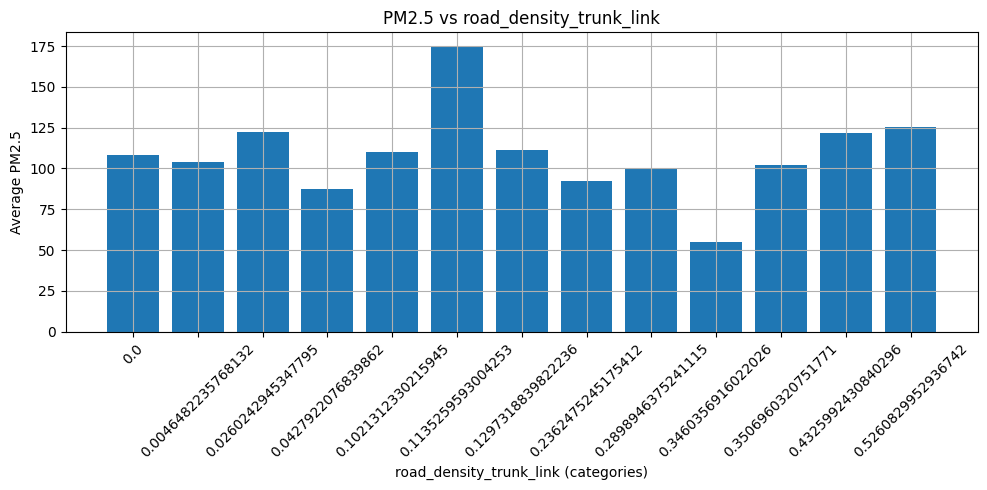


Feature: road_density_primary_link
--------------------------------------------------
0.0             104.22
0.0013733607019151 84.47
0.0031120542017687 120.25
0.0047998537752981 96.34
0.0074135837402759 93.35
0.0089228404072212 125.22
0.0108892473066255 121.77
0.0178143151017518 114.56
0.0204465261747507 98.02
0.0234382823558018 107.83
0.0248723064265115 120.23
0.0315863218699199 101.87
0.0445574944091289 54.77
0.0477697780490177 174.70
0.0603496141912857 122.13
0.0904966744850107 110.08
0.0945584930335853 109.59
0.0947508150585407 87.66
0.1029084388561032 96.50
0.1982622688913928 119.27
0.250509675950066 124.24
0.2777994692523819 99.90
0.3423167924102135 111.61
0.4023128352310905 122.00
0.516202786599652 92.61


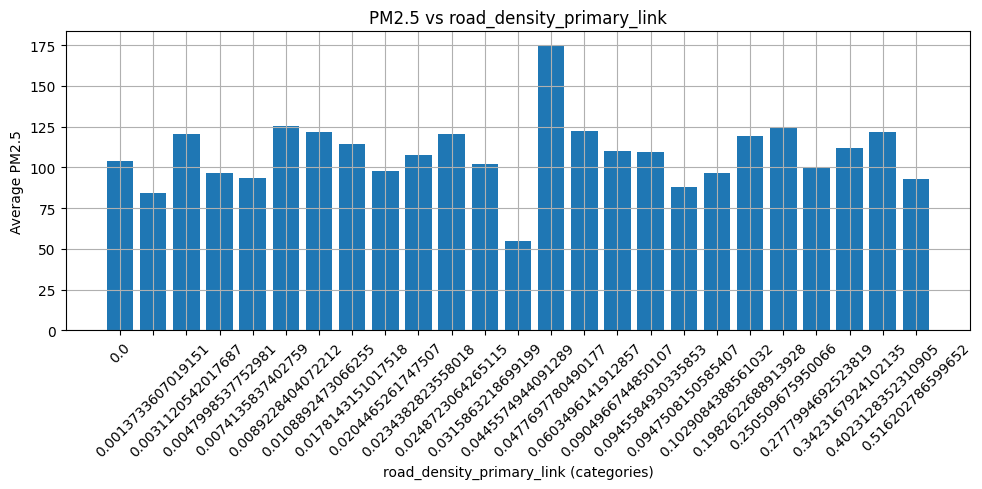


Feature: road_density_secondary_link
--------------------------------------------------
0.0             101.42
0.0013713972802574 122.13
0.0072000502420708 114.56
0.0144046157940055 125.22
0.0185708979282305 110.08
0.0253358662772913 109.59
0.0269626055215541 111.61
0.0465528411337921 104.22
0.0494679930012661 87.66
0.07463336010861 96.34
0.0807953847246227 119.27
0.098897356410279 174.70
0.120929926373514 93.35
0.1246960560272176 96.50
0.1284790037282437 101.87
0.1302996233328973 124.24
0.1506193637684654 120.23
0.1645651064140382 107.83
0.1819843449054003 122.00
0.2603884305426228 120.25
0.3563140922340349 54.77
0.381384305995648 92.61
0.7163368032213447 99.90


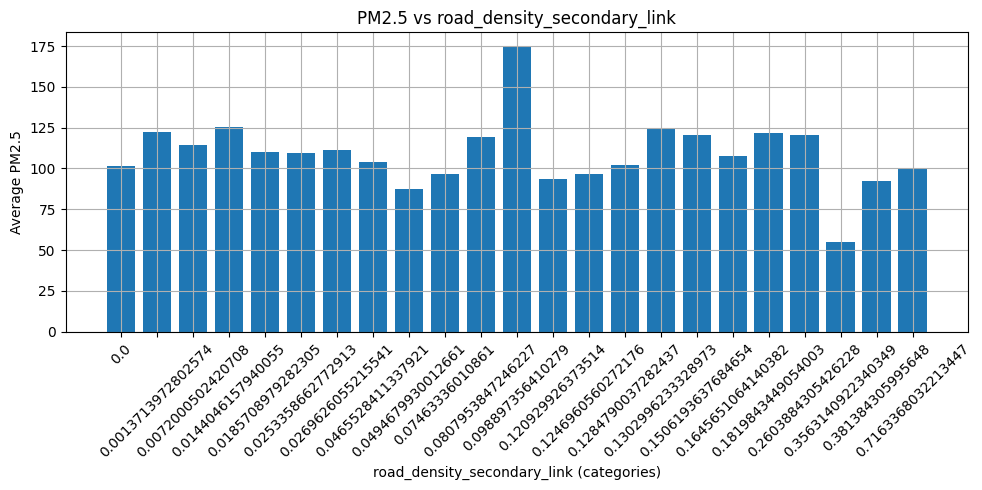


Feature: road_density_tertiary_link
--------------------------------------------------
0.0             91.30
0.0019450675786287 107.83
0.0031041020102235 121.77
0.0033337395408122 110.08
0.00506572508908 101.87
0.0082895176822782 109.59
0.0084138093332521 96.34
0.0085951836487832 119.27
0.0109179727096381 99.90
0.0115033126434943 114.56
0.0177179652567694 87.66
0.0200920563940335 54.77
0.0260354145560307 120.25
0.02604675312803 122.13
0.0328647214983101 92.61
0.0342508712523751 122.00
0.038074433971684 93.35
0.0389581932688163 111.61
0.0400151581561322 125.22
0.0484933419993409 96.50
0.0551021697133462 124.24
0.0633847480772763 174.70
0.0787601133527608 120.23
0.0824019398241066 104.22


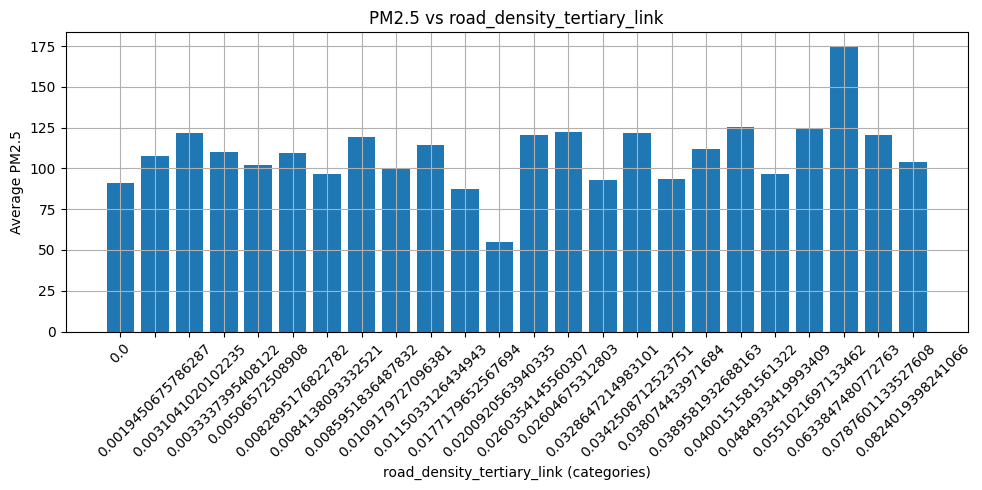


Feature: average_road_density
--------------------------------------------------
0.6193608970146663 84.47
1.595440590744984 98.02
2.329671021354267 87.66
2.475461168826784 121.77
2.4892987605053425 99.90
2.502870945818462 109.59
2.950435080927807 54.77
3.0008917969967417 110.08
3.039399662304976 101.87
3.590276877696044 96.34
3.6840617877864648 107.83
3.741387810970648 93.35
3.783199906760396 120.25
3.886387200777345 174.70
4.003077681099499 114.56
4.010163014831823 125.22
4.044490207007204 120.23
4.238228604574808 119.27
4.252074222029776 122.00
4.25485567524473 92.61
4.255919955639448 111.61
4.550272687770237 124.24
4.6060445979615645 96.50
4.675748328412778 104.22
5.957962303943281 122.13


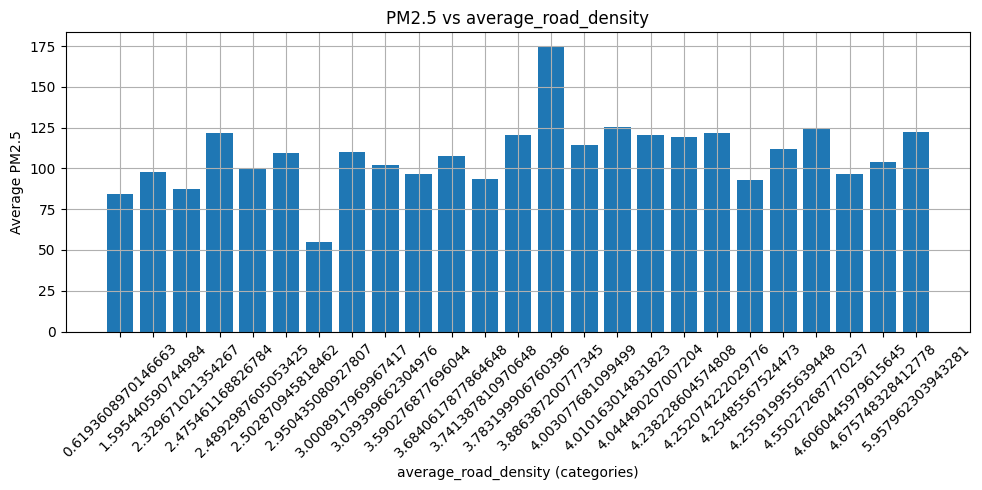


Feature: population_density
--------------------------------------------------
546.625         84.47
2596.9411764705883 109.59
2902.1875       121.77
4737.0          99.90
8895.823529411764 98.02
11228.235294117649 174.70
11558.3125      114.56
13196.5625      125.22
17075.8125      87.66
18088.666666666668 110.08
18271.42105263158 120.23
19173.25        93.35
20865.470588235294 101.87
21946.13333333333 92.61
22992.93333333333 120.25
25190.82352941177 96.34
25607.58823529412 122.13
26165.9375      111.61
27941.0         96.50
29442.625       122.00
30773.722222222223 124.24
31650.33333333333 104.22
34047.82352941176 54.77
35465.41176470588 119.27


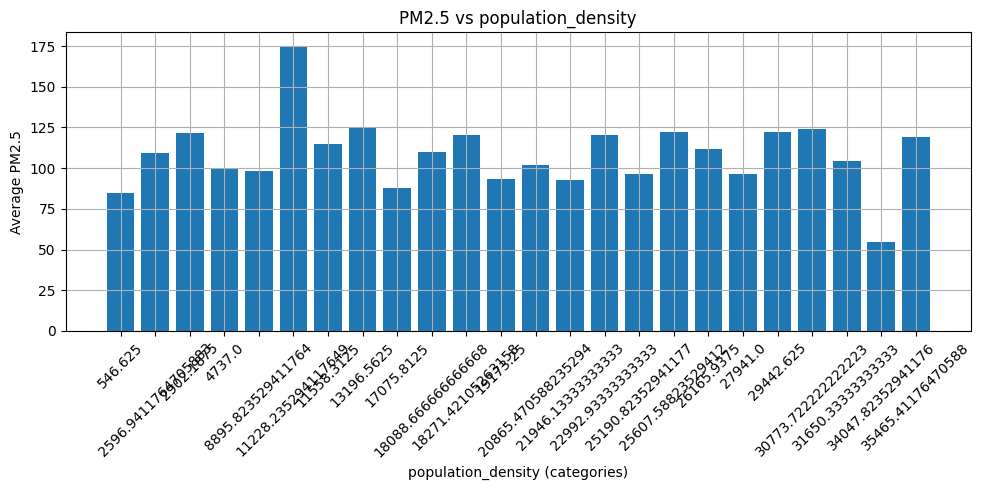


Feature: hour
--------------------------------------------------
0               128.31
1               127.01
2               122.58
3               120.74
4               119.73
5               118.81
6               119.77
7               122.02
8               125.23
9               123.37
10              115.16
11              104.68
12              93.69
13              84.81
14              77.87
15              73.17
16              71.35
17              73.72
18              81.97
19              97.88
20              113.46
21              122.25
22              127.13
23              129.12


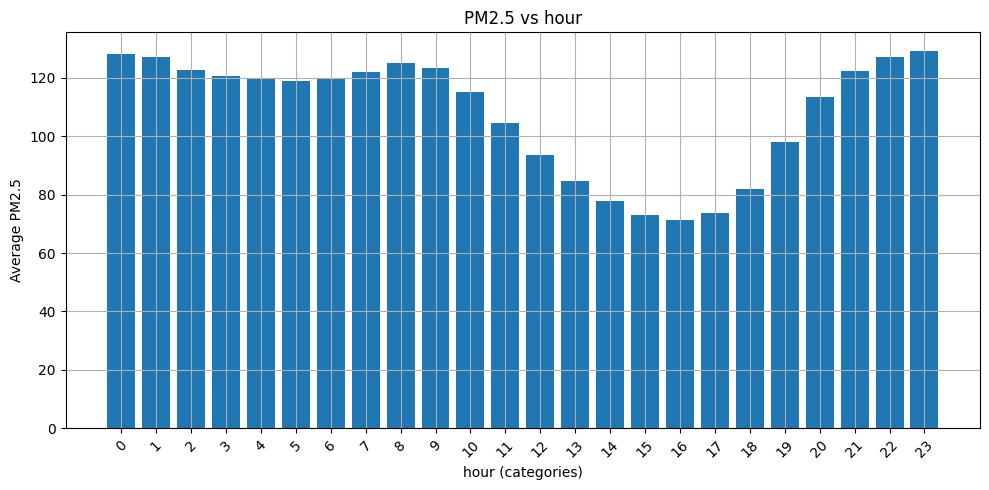


Feature: day
--------------------------------------------------
1               89.40
2               106.15
3               109.19
4               107.92
5               111.05
6               111.19
7               107.77
8               106.99
9               124.09
10              94.10
11              102.01
12              100.72
13              124.48
14              111.95
15              104.00
16              130.31
17              118.94
18              100.58
19              99.19
20              91.52
21              114.61
22              128.73
23              111.62
24              108.05
25              97.82
26              112.06
27              105.69
28              94.22
29              116.19
30              106.68
31              101.23


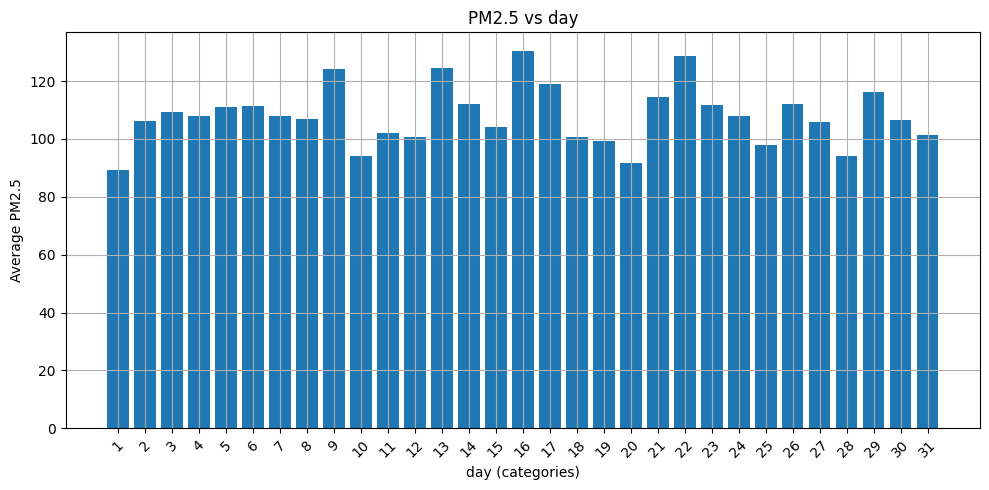


Feature: month
--------------------------------------------------
1               189.26
2               118.70
3               78.61
4               70.44
5               66.86
6               44.82
7               34.05
8               37.19
9               41.19
10              108.73
11              261.70
12              218.23


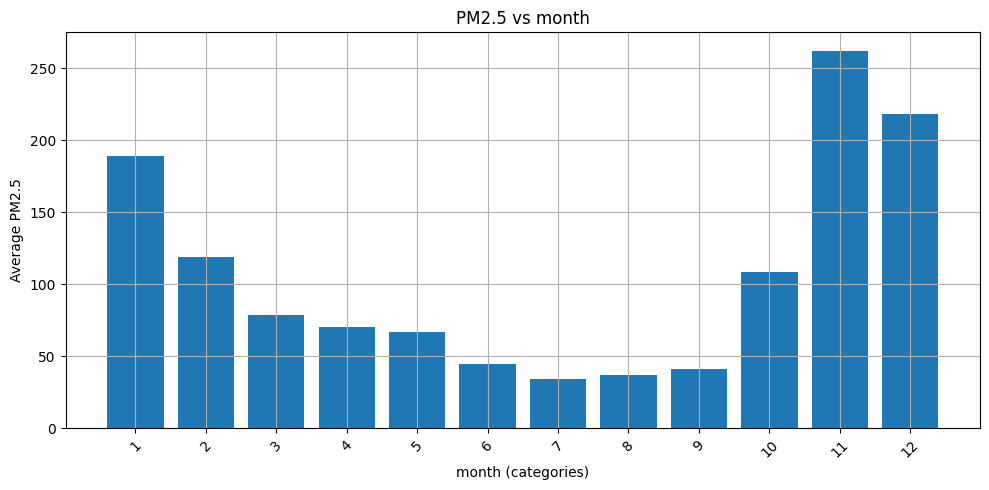

In [37]:
import matplotlib.pyplot as plt

# Loop through the selected features
for feature in dis_features:
    print(f"\nFeature: {feature}")
    print("-" * 50)
    
    # Drop rows where the feature is NaN
    df_filtered = df.dropna(subset=[feature])
    
    # Get unique values (assumed to be categorical) for this feature
    unique_values = sorted(df_filtered[feature].unique())

    pm25_averages = []

    for val in unique_values:
        avg_pm25 = df_filtered[df_filtered[feature] == val]['PM2.5'].mean()
        pm25_averages.append(avg_pm25)
        print(f"{val:<15} {avg_pm25:.2f}")

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.bar([str(v) for v in unique_values], pm25_averages)
    plt.xlabel(f"{feature} (categories)")
    plt.ylabel("Average PM2.5")
    plt.title(f"PM2.5 vs {feature}")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.grid(True)
    plt.show()

Continuous Features

(1.35, 7.08]              207.57
(7.08, 12.81]             207.74
(12.81, 18.54]            173.95
(18.54, 24.27]            130.01
(24.27, 30.0]             83.68
(30.0, 35.73]             56.23
(35.73, 41.46]            43.39
(41.46, 47.19]            51.11
(47.19, 52.92]            55.64
(52.92, 58.65]            109.38


/tmp/ipykernel_787544/427291002.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df_filtered.groupby('binned')['PM2.5'].mean().reset_index()


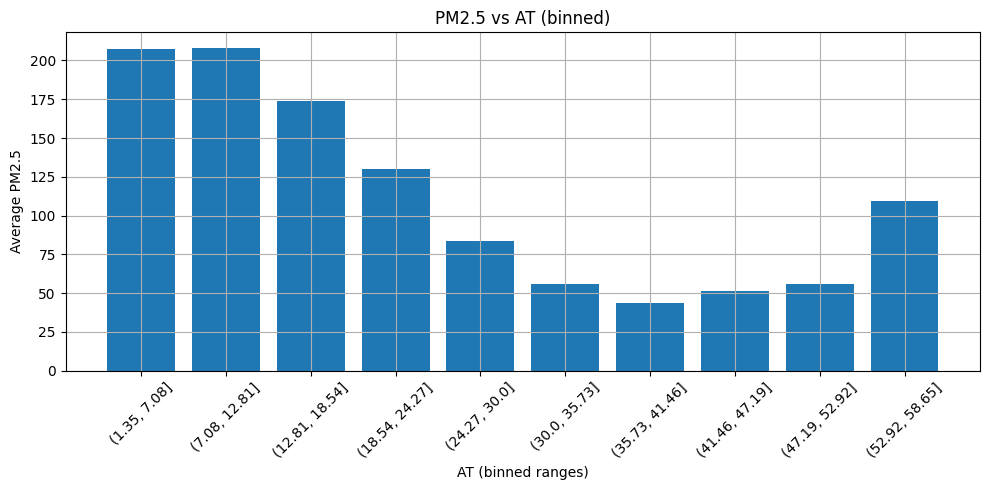

/tmp/ipykernel_787544/427291002.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df_filtered.groupby('binned')['PM2.5'].mean().reset_index()


(0.0, 819.15]             52.64
(819.15, 1638.3]          nan
(1638.3, 2457.45]         nan
(2457.45, 3276.6]         nan
(3276.6, 4095.75]         nan
(4095.75, 4914.9]         nan
(4914.9, 5734.05]         nan
(5734.05, 6553.2]         nan
(6553.2, 7372.35]         nan
(7372.35, 8191.5]         119.50


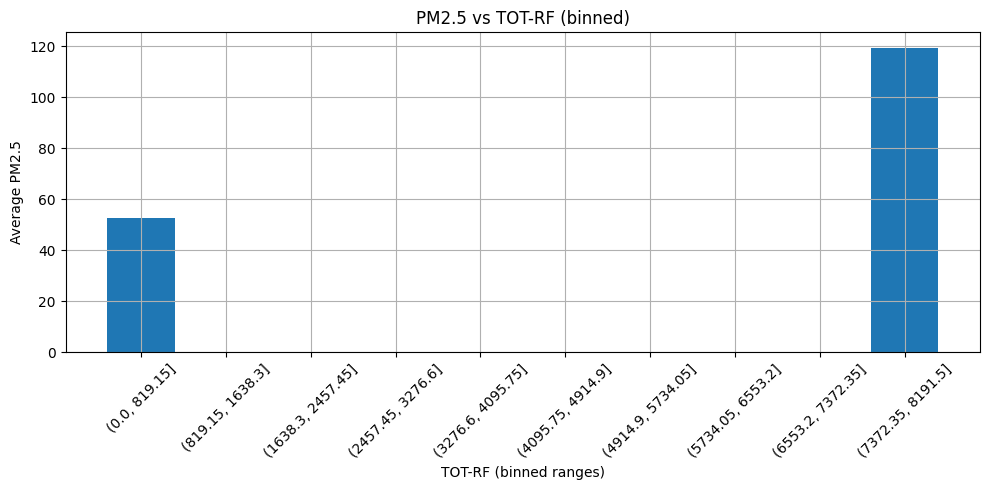

/tmp/ipykernel_787544/427291002.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df_filtered.groupby('binned')['PM2.5'].mean().reset_index()


(701.78, 741.492]         118.00
(741.492, 781.204]        203.37
(781.204, 820.916]        156.53
(820.916, 860.628]        58.41
(860.628, 900.34]         61.10
(900.34, 940.052]         68.48
(940.052, 979.764]        79.60
(979.764, 1019.476]       145.71
(1019.476, 1059.188]      49.83
(1059.188, 1098.9]        66.88


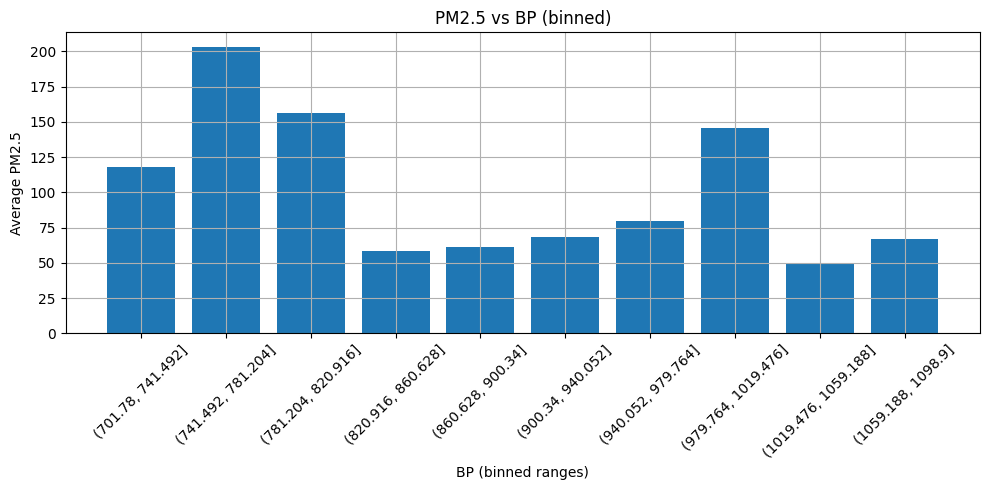

/tmp/ipykernel_787544/427291002.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df_filtered.groupby('binned')['PM2.5'].mean().reset_index()


(0.0, 2.7]                52.57
(2.7, 5.4]                39.77
(5.4, 8.1]                43.18
(8.1, 10.8]               36.86
(10.8, 13.5]              52.08
(13.5, 16.2]              32.35
(16.2, 18.9]              57.72
(18.9, 21.6]              nan
(21.6, 24.3]              42.00
(24.3, 27.0]              16.00


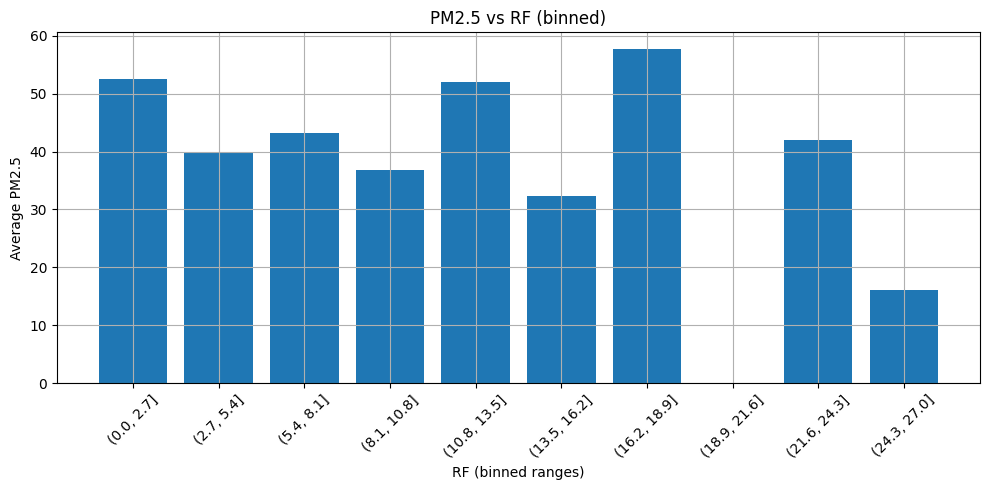

/tmp/ipykernel_787544/427291002.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df_filtered.groupby('binned')['PM2.5'].mean().reset_index()


(0.1, 36.09]              120.61
(36.09, 72.08]            118.43
(72.08, 108.07]           105.92
(108.07, 144.06]          107.52
(144.06, 180.05]          105.76
(180.05, 216.04]          107.95
(216.04, 252.03]          109.40
(252.03, 288.02]          104.26
(288.02, 324.01]          98.77
(324.01, 360.0]           112.91


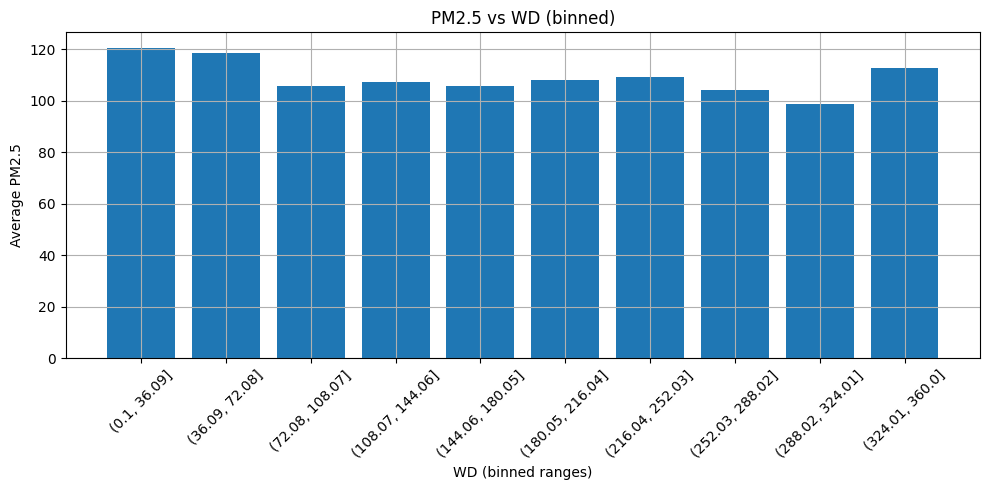

/tmp/ipykernel_787544/427291002.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df_filtered.groupby('binned')['PM2.5'].mean().reset_index()


(0.825, 10.742]           291.34
(10.742, 20.66]           94.85
(20.66, 30.578]           44.37
(30.578, 40.495]          61.53
(40.495, 50.413]          86.15
(50.413, 60.33]           90.04
(60.33, 70.248]           97.00
(70.248, 80.165]          118.95
(80.165, 90.083]          153.77
(90.083, 100.0]           166.14


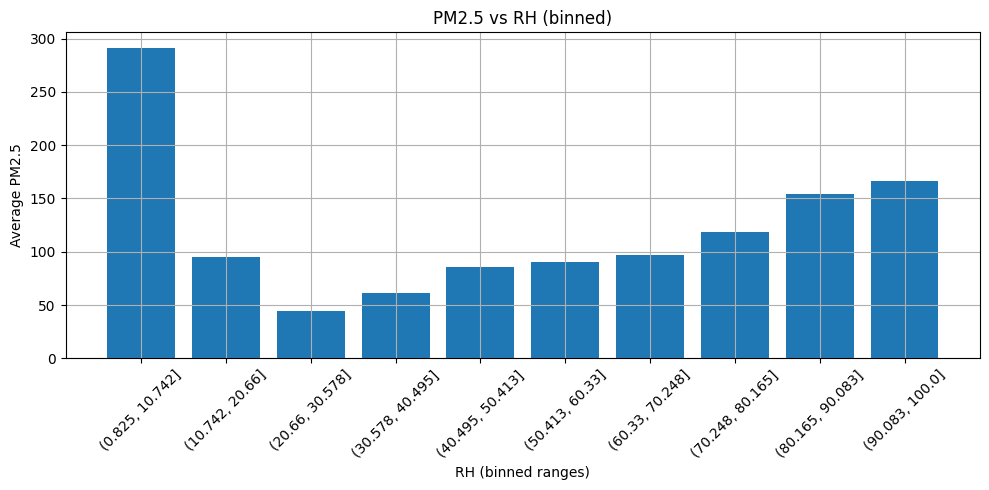

/tmp/ipykernel_787544/427291002.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df_filtered.groupby('binned')['PM2.5'].mean().reset_index()


(0.01, 2.919]             109.79
(2.919, 5.828]            63.74
(5.828, 8.737]            74.53
(8.737, 11.646]           90.17
(11.646, 14.555]          86.06
(14.555, 17.464]          50.00
(17.464, 20.373]          nan
(20.373, 23.282]          nan
(23.282, 26.191]          nan
(26.191, 29.1]            99.75


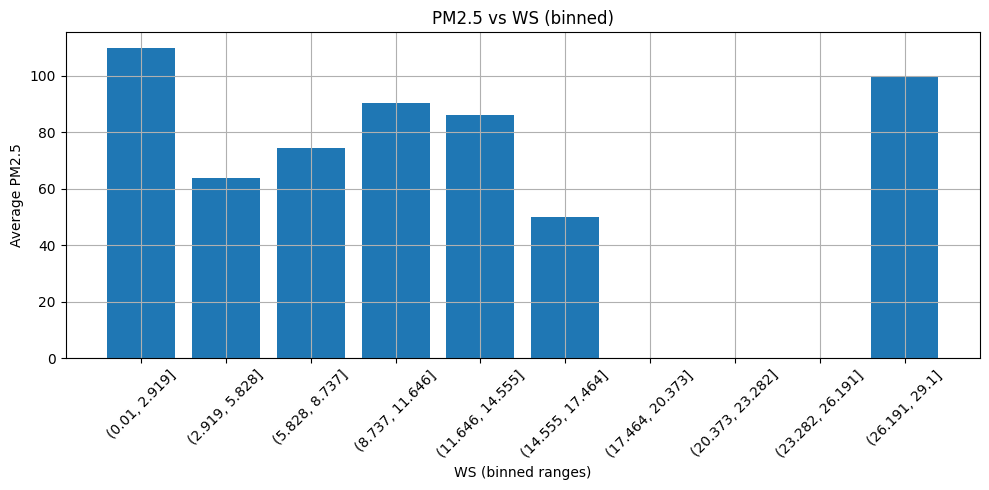

/tmp/ipykernel_787544/427291002.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df_filtered.groupby('binned')['PM2.5'].mean().reset_index()


(0.0, 153.322]            113.86
(153.322, 306.645]        111.22
(306.645, 459.968]        77.75
(459.968, 613.29]         53.48
(613.29, 766.612]         44.72
(766.612, 919.935]        47.16
(919.935, 1073.258]       176.48
(1073.258, 1226.58]       142.33
(1226.58, 1379.902]       112.03
(1379.902, 1533.225]      126.50


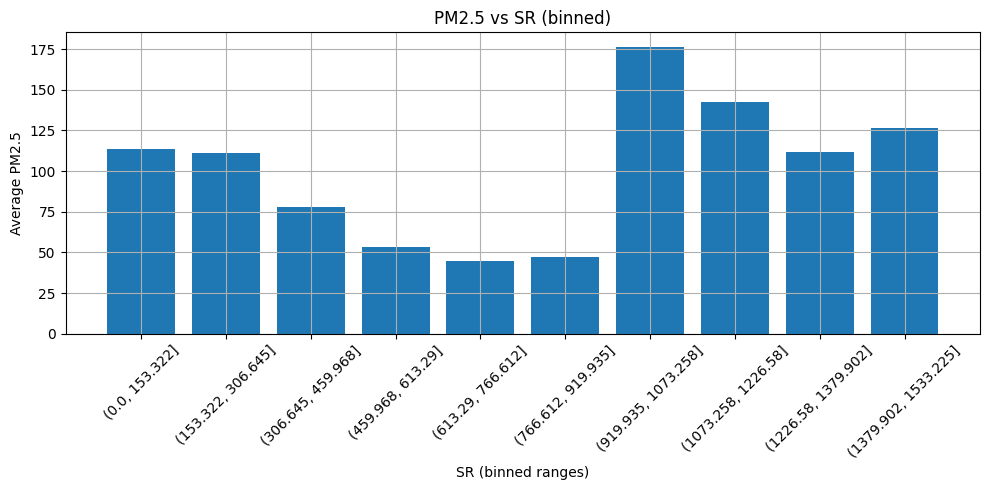

In [10]:
num_bins = 10 
for feature in cts_features:
    # Bin the continuous feature into ranges
    bins = np.linspace(df_filtered[feature].min(), df_filtered[feature].max(), num_bins + 1)
    df_filtered['binned'] = pd.cut(df_filtered[feature], bins)

    grouped = df_filtered.groupby('binned')['PM2.5'].mean().reset_index()
    grouped['bin_label'] = grouped['binned'].astype(str)

    # Print bin ranges and average PM2.5
    for idx, row in grouped.iterrows():
        print(f"{row['bin_label']:<25} {row['PM2.5']:.2f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.bar(grouped['bin_label'], grouped['PM2.5'])
    plt.xlabel(f"{feature} (binned ranges)")
    plt.ylabel("Average PM2.5")
    plt.title(f"PM2.5 vs {feature} (binned)")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.grid(True)
    plt.show()

## Line Plots Features vs PM2.5

In [ ]:
def plot(data, tagert_column):
    for column in df.columns:
        if column != target_column:
            df1 = df.groupby(column)[target_column].mean().reset_index()
            df1 = df1.sort_values(by=column)
            plt.figure(figsize=(8,6)) 
            plt.plot(df1[column], df1[target_column])
            plt.xlabel(column)
            plt.ylabel(tagert_column)
            plt.title(f'Dependency of {target_column} on {column}')
            plt.grid(True)
            plt.show()

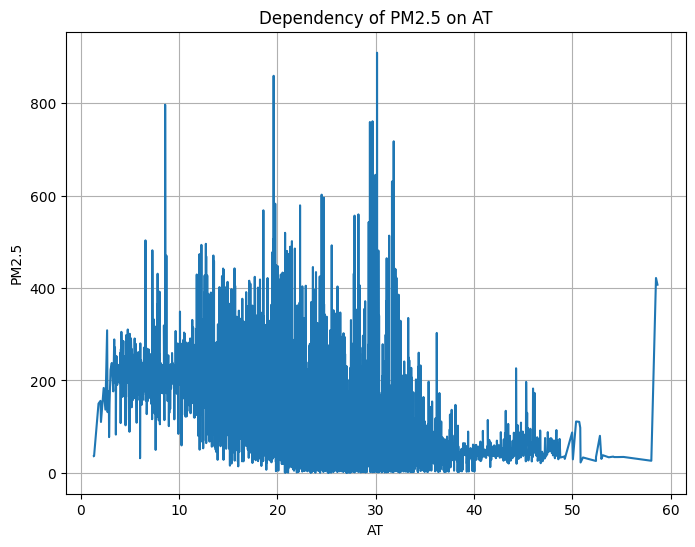

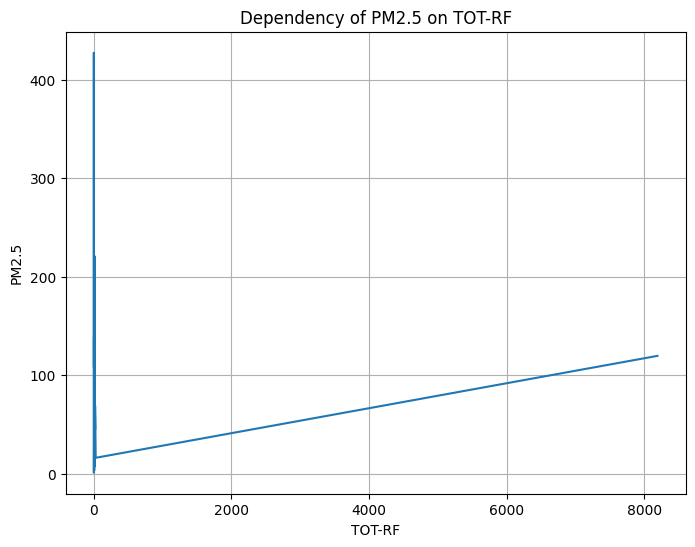

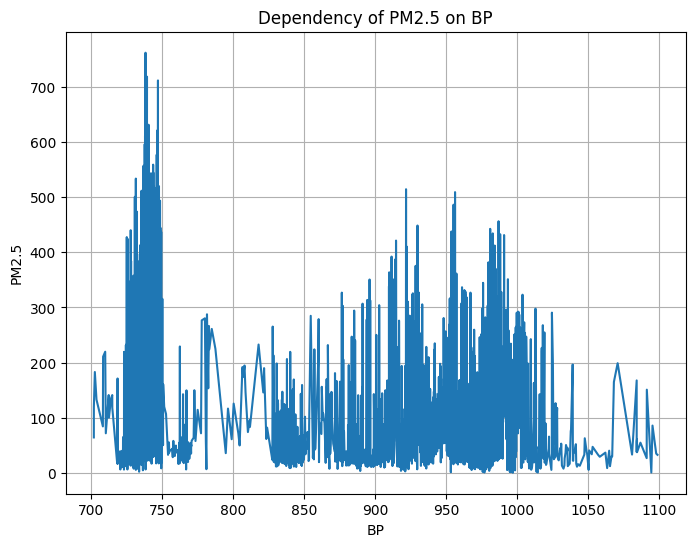

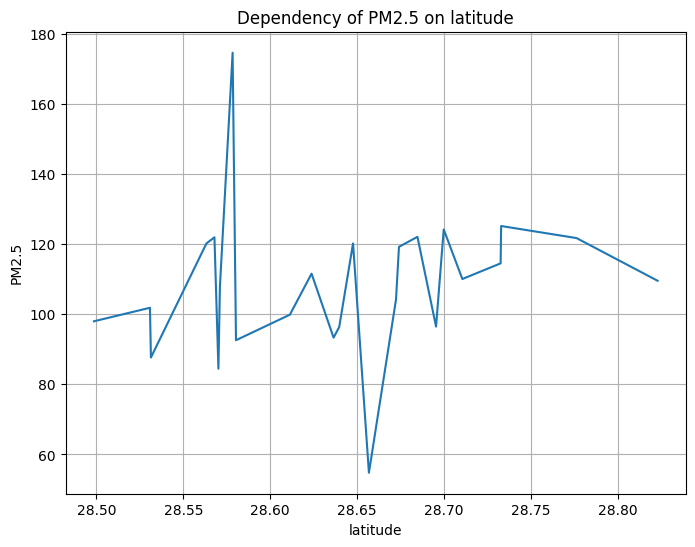

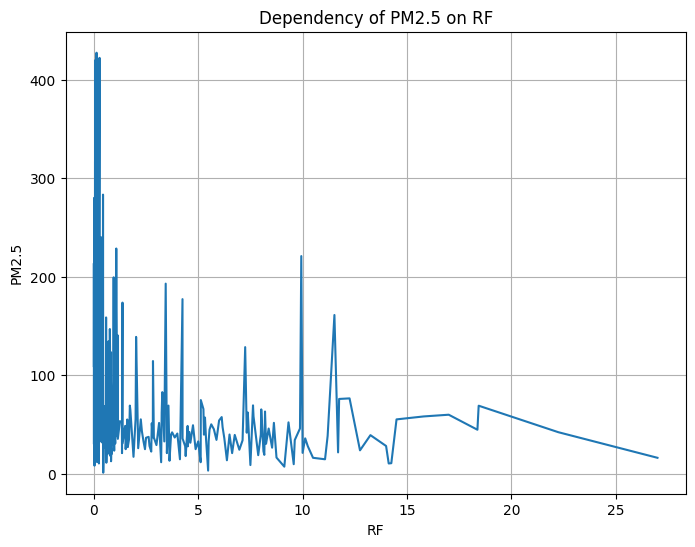

...

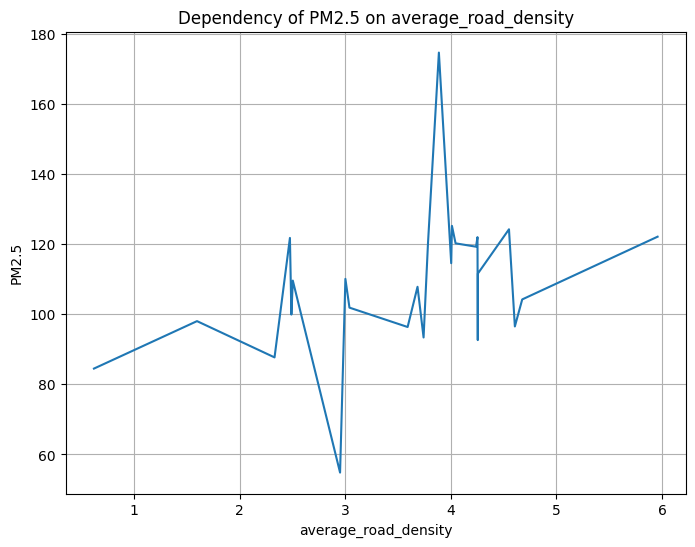

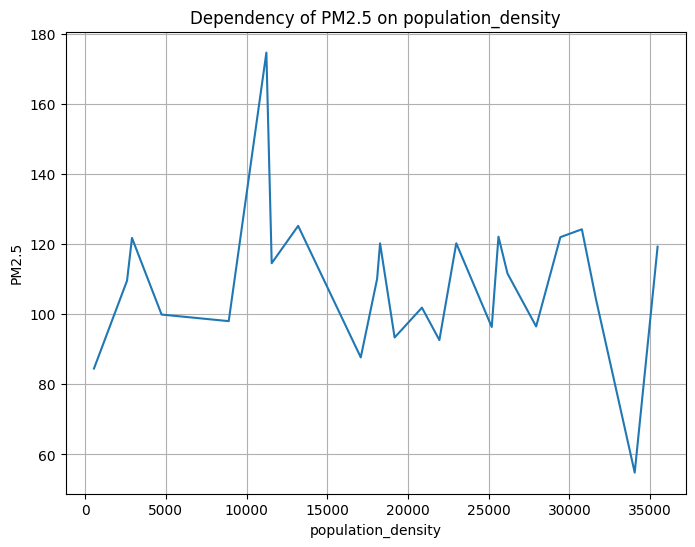

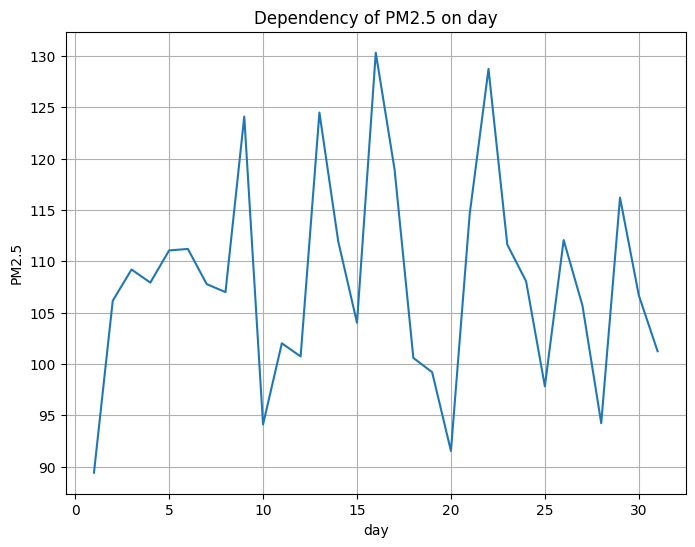

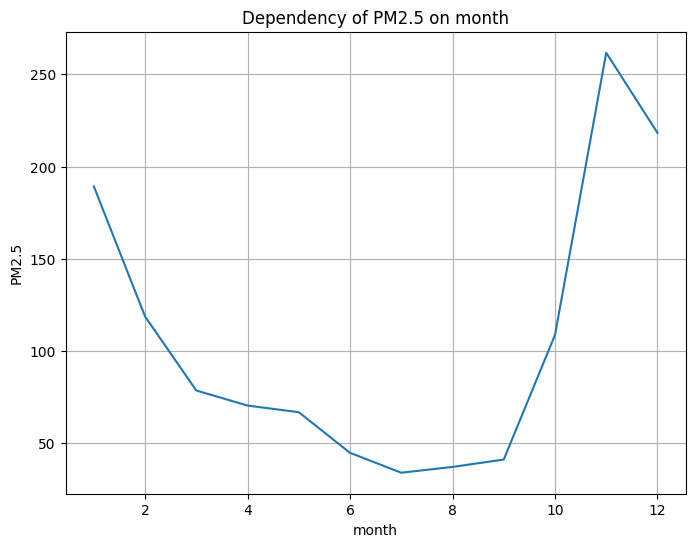

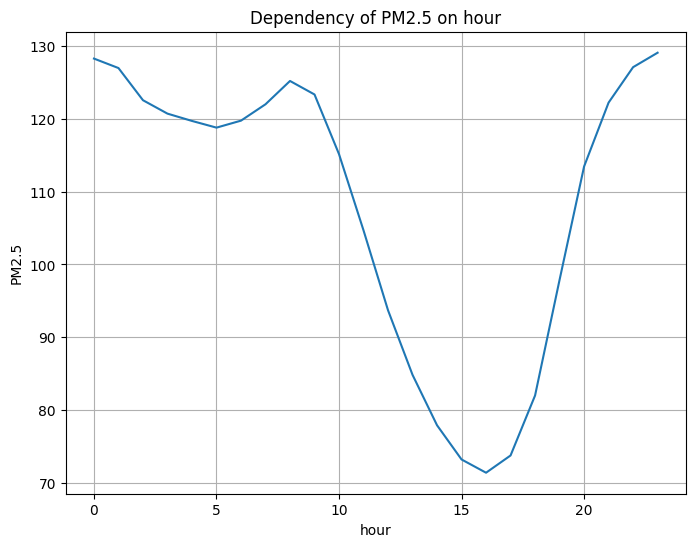

In [ ]:
import matplotlib.pyplot as plt
target_column = 'PM2.5'
plot(df, target_column)

## Bar Plots of Feature Set vs Correlation with PM2.5

In [ ]:
spt_features = ['latitude','longitude', 'average_road_density']
met_features = ['AT', 'TOT-RF', 'BP',  'RF', 'WD', 'RH', 'WS', 'SR']
pois = ['C1: Vehicle Services', 'C2: Transportation Spots',
       'C3: Factories', 'C4: Decoration & Furniture Markets',
       'C5: Food & Beverage', 'C6: Shopping Malls & Supermarkets',
       'C7: Sports', 'C8: Parks', 'C9: Culture & Education',
       'C10: Entertainment', 'C11: Companies', 'C12: Hotels & Real Estate']
road_data = ['motorway', 'trunk', 'primary', 'secondary', 'tertiary', 'unclassified',
       'residential', 'service', 'motorway_link', 'trunk_link', 'primary_link',
       'secondary_link', 'tertiary_link']
road_density = ['road_density_motorway', 'road_density_trunk', 'road_density_primary', 'road_density_secondary',
       'road_density_tertiary', 'road_density_unclassified',
       'road_density_residential', 'road_density_service',
       'road_density_motorway_link', 'road_density_trunk_link',
       'road_density_primary_link', 'road_density_secondary_link',
       'road_density_tertiary_link']
temp_features =['day', 'month', 'hour']
population = ['population_density']

feature_groups ={
    'Spatial': spt_features,
    'Temporal': temp_features,
    'Meteorological': met_features,
    'Point0fInterset': pois,
    'Road': road_data,
    'Road_density': road_density,
    'Population': population
}


--- Spatial Features ---
latitude vs PM2.5 correlation: 0.0499
longitude vs PM2.5 correlation: -0.0008
average_road_density vs PM2.5 correlation: 0.0688


/tmp/ipykernel_827290/7774766.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_name, y=correlation, palette='viridis')


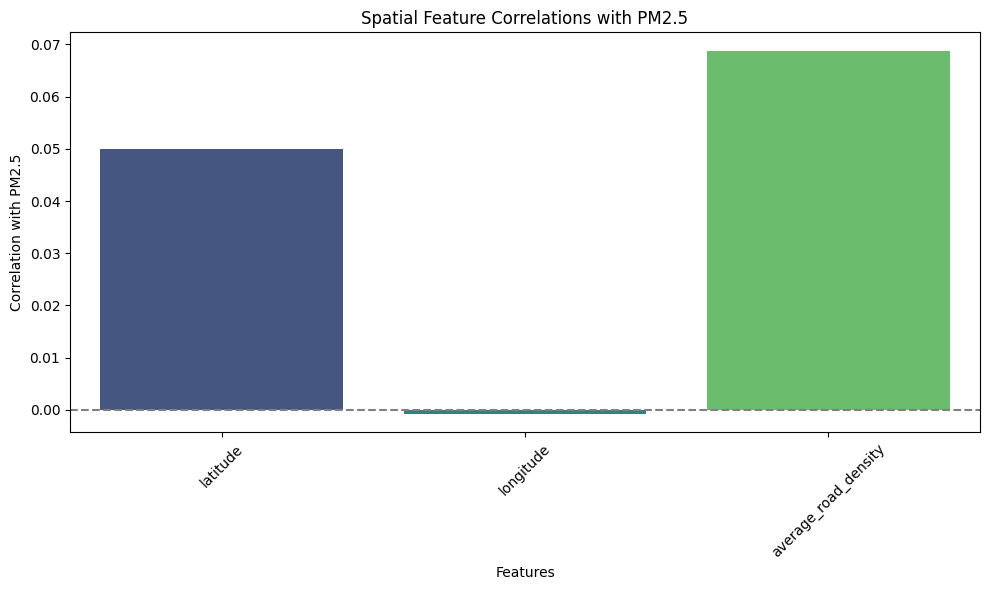


--- Temporal Features ---
day vs PM2.5 correlation: 0.0029
month vs PM2.5 correlation: 0.1971
hour vs PM2.5 correlation: -0.0766


/tmp/ipykernel_827290/7774766.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_name, y=correlation, palette='viridis')


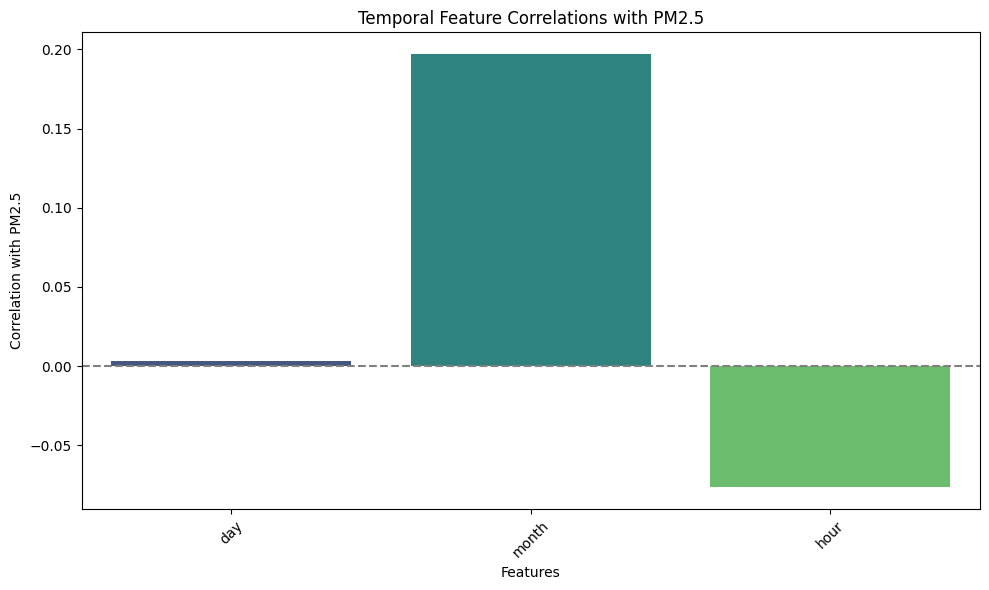


--- Meteorological Features ---
AT vs PM2.5 correlation: -0.5327
TOT-RF vs PM2.5 correlation: -0.0002
BP vs PM2.5 correlation: -0.0169
RF vs PM2.5 correlation: -0.0365
WD vs PM2.5 correlation: -0.0312
RH vs PM2.5 correlation: 0.2948
WS vs PM2.5 correlation: -0.2087
SR vs PM2.5 correlation: -0.1421


/tmp/ipykernel_827290/7774766.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_name, y=correlation, palette='viridis')


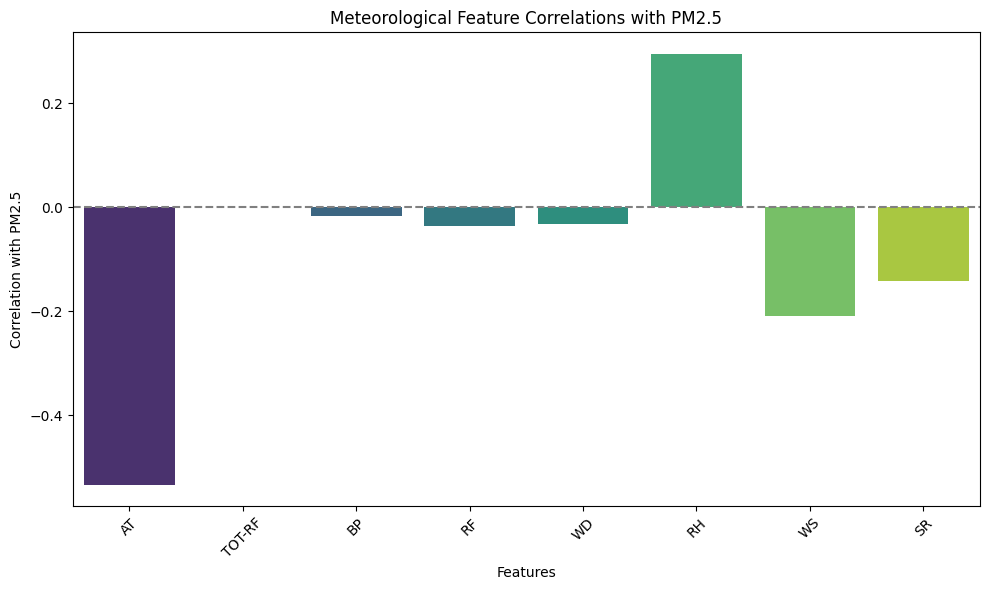


--- Point0fInterset Features ---
C1: Vehicle Services vs PM2.5 correlation: -0.0056
C2: Transportation Spots vs PM2.5 correlation: -0.0405
C3: Factories vs PM2.5 correlation: 0.0167
C4: Decoration & Furniture Markets vs PM2.5 correlation: 0.0153
C5: Food & Beverage vs PM2.5 correlation: -0.0327


/tmp/ipykernel_827290/7774766.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_name, y=correlation, palette='viridis')


C6: Shopping Malls & Supermarkets vs PM2.5 correlation: 0.0038
C7: Sports vs PM2.5 correlation: -0.0034
C8: Parks vs PM2.5 correlation: 0.0181
C9: Culture & Education vs PM2.5 correlation: 0.0107
C10: Entertainment vs PM2.5 correlation: -0.0255
C11: Companies vs PM2.5 correlation: -0.0223
C12: Hotels & Real Estate vs PM2.5 correlation: -0.0490


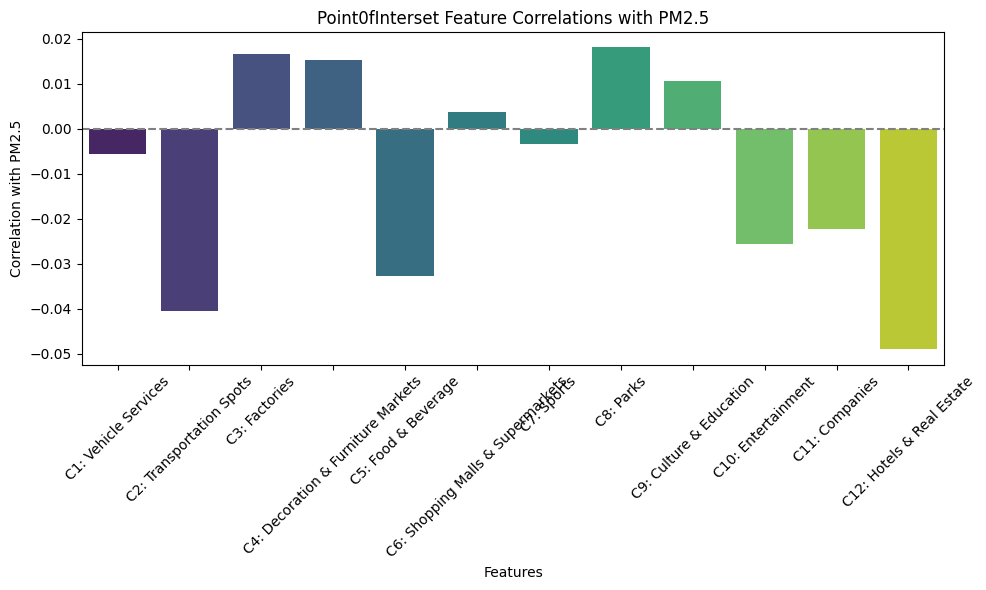


--- Road Features ---
motorway vs PM2.5 correlation: 0.0290
trunk vs PM2.5 correlation: 0.0076
primary vs PM2.5 correlation: 0.0406
secondary vs PM2.5 correlation: -0.0478
tertiary vs PM2.5 correlation: 0.0096
unclassified vs PM2.5 correlation: -0.0099
residential vs PM2.5 correlation: 0.0331
service vs PM2.5 correlation: -0.0034
motorway_link vs PM2.5 correlation: 0.0302
trunk_link vs PM2.5 correlation: 0.0046
primary_link vs PM2.5 correlation: 0.0257
secondary_link vs PM2.5 correlation: -0.0483
tertiary_link vs PM2.5 correlation: 0.0128


/tmp/ipykernel_827290/7774766.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_name, y=correlation, palette='viridis')


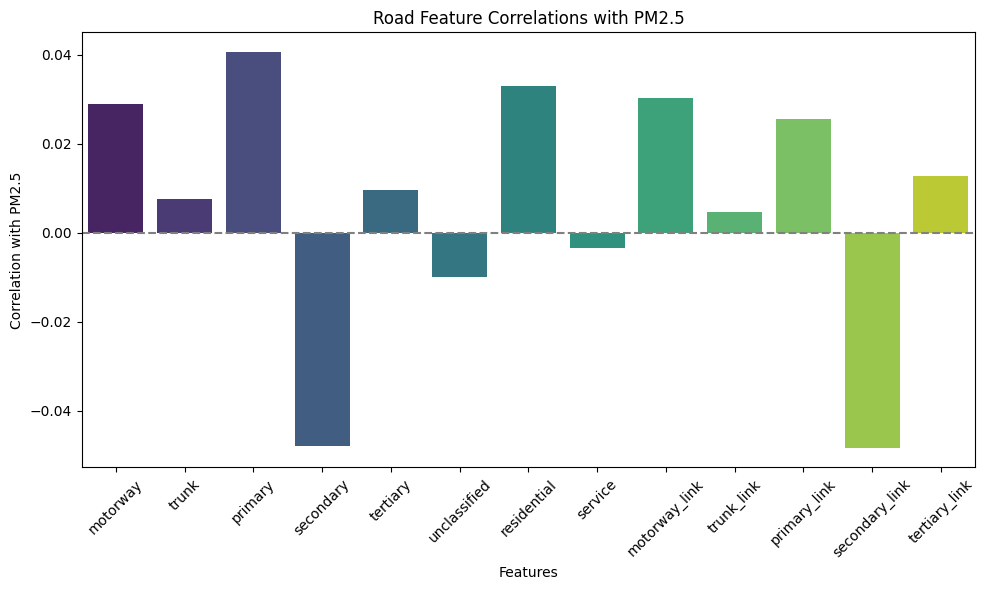


--- Road_density Features ---
road_density_motorway vs PM2.5 correlation: 0.0281
road_density_trunk vs PM2.5 correlation: 0.0068
road_density_primary vs PM2.5 correlation: 0.0693
road_density_secondary vs PM2.5 correlation: -0.0359
road_density_tertiary vs PM2.5 correlation: 0.0273
road_density_unclassified vs PM2.5 correlation: -0.0107
road_density_residential vs PM2.5 correlation: 0.0691
road_density_service vs PM2.5 correlation: 0.0211
road_density_motorway_link vs PM2.5 correlation: 0.0269
road_density_trunk_link vs PM2.5 correlation: 0.0104
road_density_primary_link vs PM2.5 correlation: 0.0038
road_density_secondary_link vs PM2.5 correlation: -0.0298
road_density_tertiary_link vs PM2.5 correlation: 0.0434


/tmp/ipykernel_827290/7774766.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_name, y=correlation, palette='viridis')


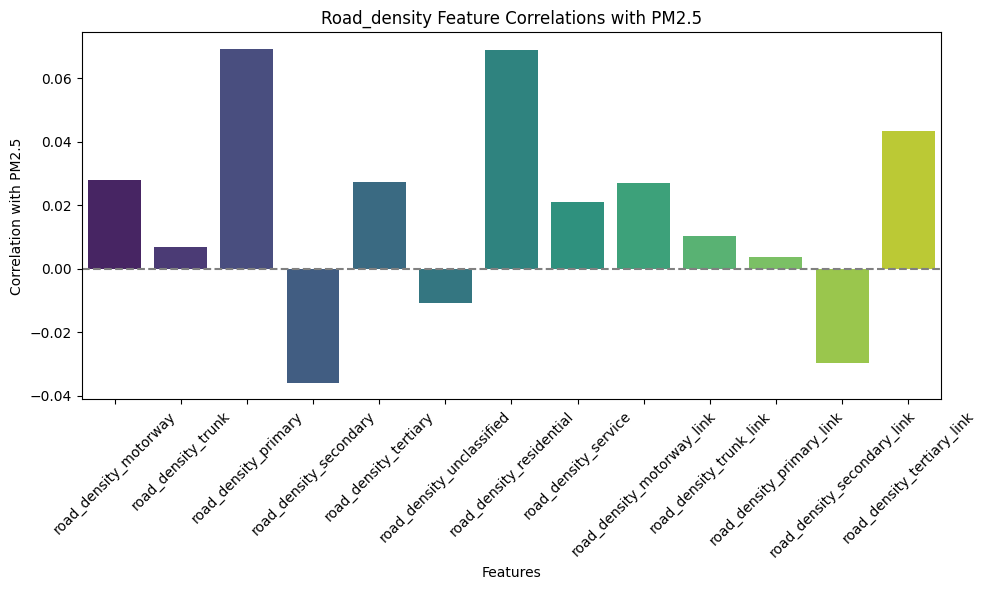


--- Population Features ---
population_density vs PM2.5 correlation: 0.0133


/tmp/ipykernel_827290/7774766.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_name, y=correlation, palette='viridis')


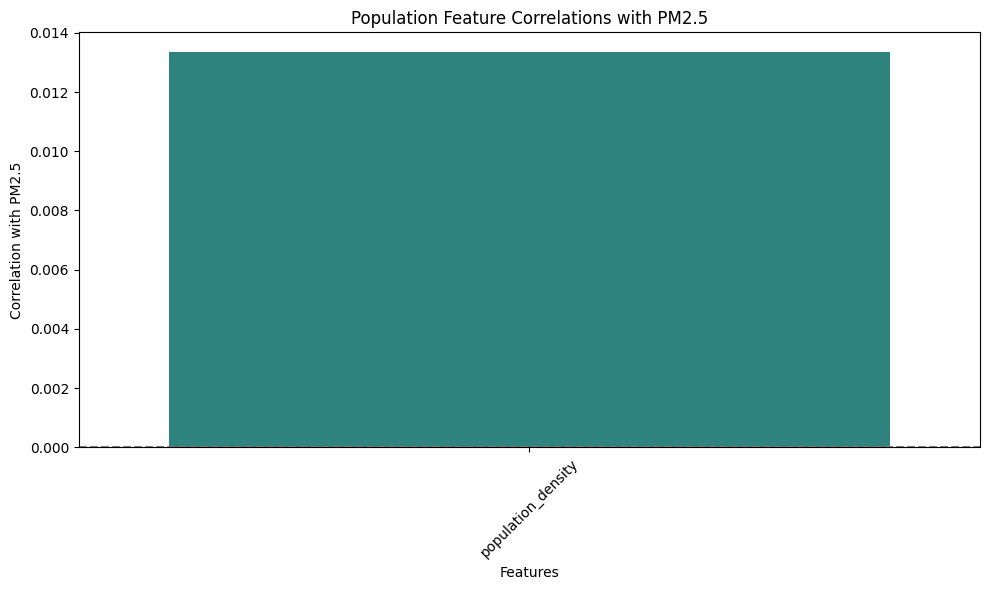

In [ ]:
import seaborn as sns

for group_name, features in feature_groups.items():
    print(f"\n--- {group_name} Features ---")
    correlation = []
    feature_name = []
    for feature in features:
        if feature in df.columns:
            corr = df[feature].corr(df[target_column])
            print(f"{feature} vs {target_column} correlation: {corr:.4f}")
            correlation.append(corr)
            feature_name.append(feature)

        else:
            print(f"{feature} not found in dataset.")

    if correlation:
        plt.figure(figsize=(10,6))
        sns.barplot(x=feature_name, y=correlation, palette='viridis')
        plt.axhline(0, color='gray', linestyle='--')
        plt.title(f'{group_name} Feature Correlations with {target_column}')
        plt.ylabel('Correlation with PM2.5')
        plt.xlabel('Features')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

## Correlation Metrics of Feature Sets

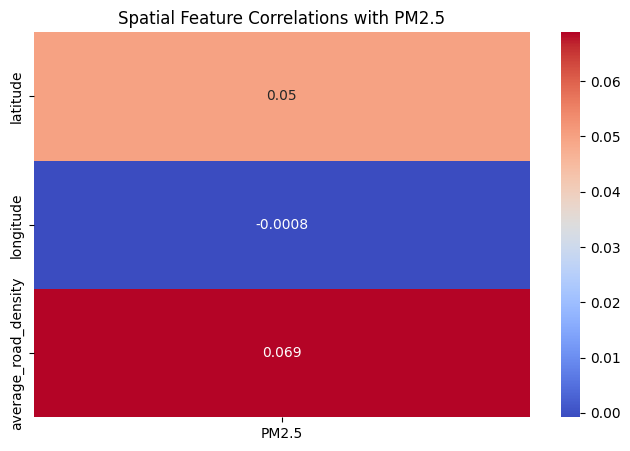

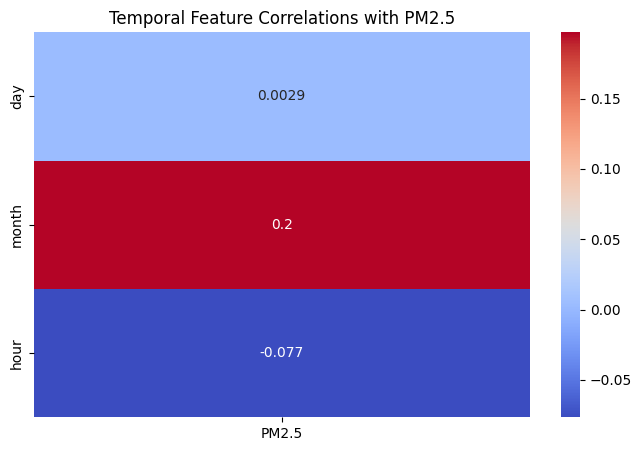

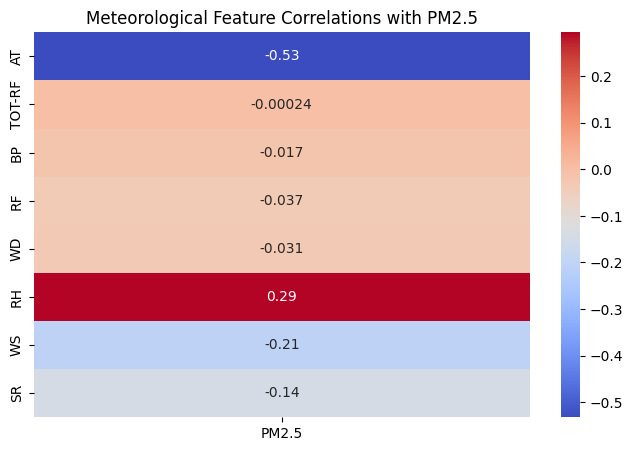

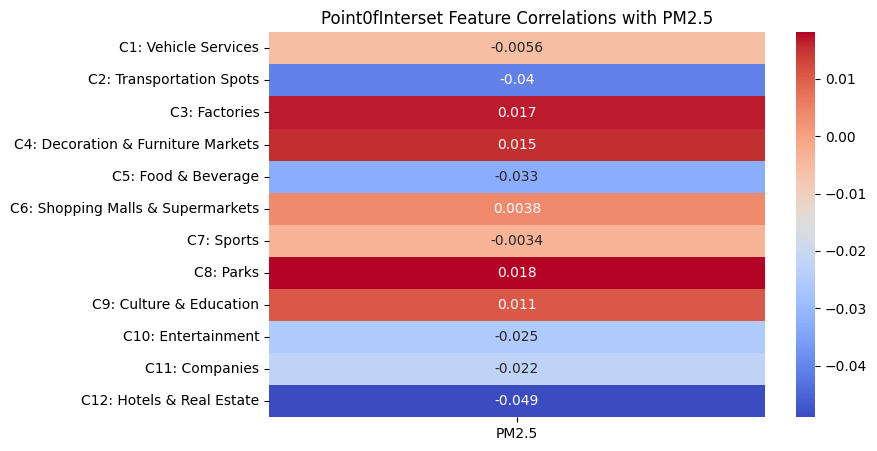

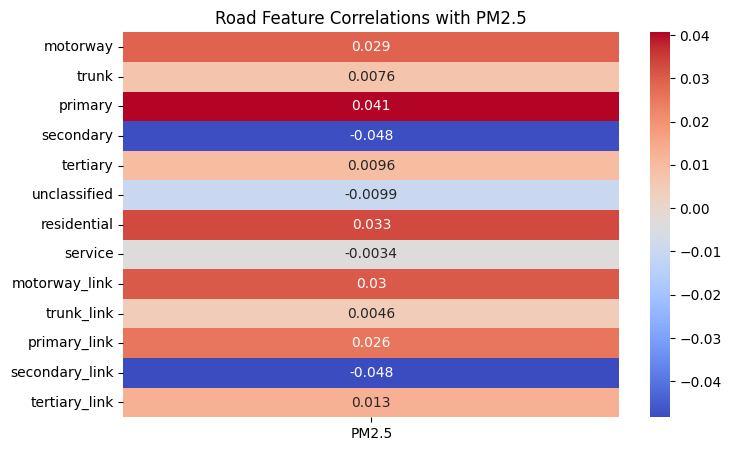

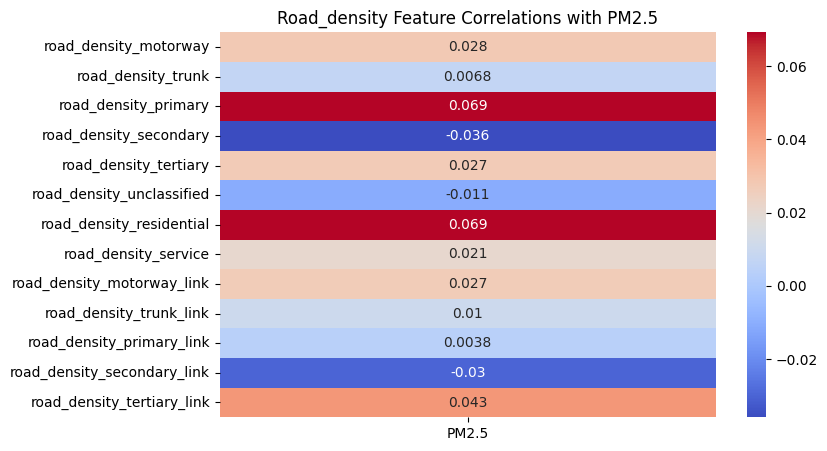

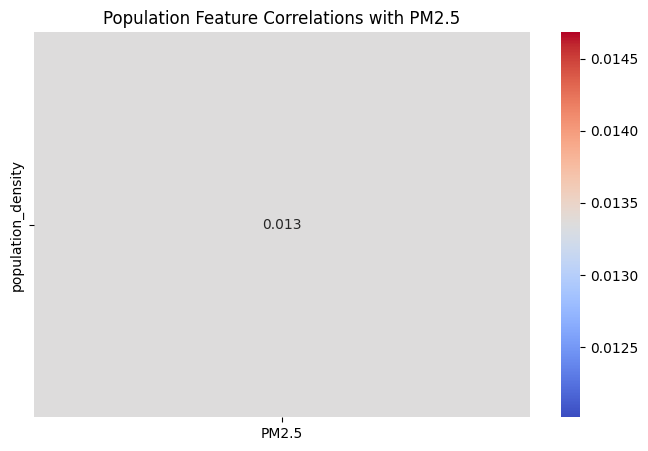

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

for group_name, features in feature_groups.items():
    valid_features = [f for f in features if f in df.columns]
    if valid_features:
        corr_matrix = df[valid_features + [target_column]].corr()
        plt.figure(figsize=(8, 5))
        sns.heatmap(corr_matrix[[target_column]].drop(target_column), annot=True, cmap='coolwarm')
        plt.title(f'{group_name} Feature Correlations with {target_column}')
        plt.show()